In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.neighbors import NearestNeighbors
from sklearn import svm, metrics
from statistics import median
import random
import os

random.seed(137)
np.random.seed(137)

%matplotlib inline

In [2]:
mimic_iii_data_dir = "/N/project/waveform_mortality/shared/datasets/clinical_datasets/mimic-iii-clinical-database-1.4/"
mimic_iv_data_dir = "/N/project/waveform_mortality/shared/datasets/clinical_datasets/mimic-iv-2.2"

### MIMIC III

In [3]:
mimic_iii_chartevents = pd.read_csv(os.path.join(mimic_iii_data_dir, "CHARTEVENTS.csv"))
mimic_iii_chartevents["CHARTTIME"] = pd.to_datetime(mimic_iii_chartevents["CHARTTIME"], errors="coerce")
mimic_iii_chartevents

/tmp/ipykernel_77557/2690258644.py:1: DtypeWarning: Columns (8,10,13,14) have mixed types. Specify dtype option on import or set low_memory=False.
  mimic_iii_chartevents = pd.read_csv(os.path.join(mimic_iii_data_dir, "CHARTEVENTS.csv"))


,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,ITEMID,CHARTTIME,STORETIME,CGID,VALUE,VALUENUM,VALUEUOM,WARNING,ERROR,RESULTSTATUS,STOPPED
0,788,36,165660,241249.0,223834,2134-05-12 12:00:00,2134-05-12 13:56:00,17525.0,15.0,15.00,L/min,0.0,0.0,NaN,NaN
1,789,36,165660,241249.0,223835,2134-05-12 12:00:00,2134-05-12 13:56:00,17525.0,100.0,100.00,NaN,0.0,0.0,NaN,NaN
2,790,36,165660,241249.0,224328,2134-05-12 12:00:00,2134-05-12 12:18:00,20823.0,0.37,0.37,NaN,0.0,0.0,NaN,NaN
3,791,36,165660,241249.0,224329,2134-05-12 12:00:00,2134-05-12 12:19:00,20823.0,6.0,6.00,min,0.0,0.0,NaN,NaN
4,792,36,165660,241249.0,224330,2134-05-12 12:00:00,2134-05-12 12:19:00,20823.0,2.5,2.50,NaN,0.0,0.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330712478,330471885,99781,147562,200664.0,224847,2133-08-02 08:30:00,2133-08-02 08:30:00,14357.0,Moderate,NaN,NaN,0.0,0.0,NaN,NaN
330712479,330471886,99781,147562,200664.0,224889,2133-08-02 08:30:00,2133-08-02 08:31:00,14357.0,Not applicable,NaN,NaN,0.0,0.0,NaN,NaN
330712480,330471887,99781,147562,200664.0,224903,2133-08-02 08:30:00,2133-08-02 08:31:00,14357.0,None,NaN,NaN,0.0,0.0,NaN,NaN
330712481,330471888,99781,147562,200664.0,224910,2133-08-02 08:30:00,2133-08-02 08:31:00,14357.0,None,NaN,NaN,0.0,0.0,NaN,NaN


In [4]:
mimic_iii_patients = pd.read_csv(os.path.join(mimic_iii_data_dir, "PATIENTS.csv"))
mimic_iii_patients["DOB"] = pd.to_datetime(mimic_iii_patients["DOB"], errors="coerce")
mimic_iii_patients

,ROW_ID,SUBJECT_ID,GENDER,DOB,DOD,DOD_HOSP,DOD_SSN,EXPIRE_FLAG
0,234,249,F,2075-03-13,NaN,NaN,NaN,0
1,235,250,F,2164-12-27,2188-11-22 00:00:00,2188-11-22 00:00:00,NaN,1
2,236,251,M,2090-03-15,NaN,NaN,NaN,0
3,237,252,M,2078-03-06,NaN,NaN,NaN,0
4,238,253,F,2089-11-26,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...
46515,31840,44089,M,2026-05-25,NaN,NaN,NaN,0
46516,31841,44115,F,2124-07-27,NaN,NaN,NaN,0
46517,31842,44123,F,2049-11-26,2135-01-12 00:00:00,2135-01-12 00:00:00,NaN,1
46518,31843,44126,F,2076-07-25,NaN,NaN,NaN,0


In [5]:
mimic_iii_patients = mimic_iii_patients[["SUBJECT_ID", "DOB"]]

In [6]:
mimic_iii_chartevents = mimic_iii_chartevents.merge(mimic_iii_patients, on="SUBJECT_ID")
mimic_iii_chartevents

,ROW_ID,SUBJECT_ID,HADM_ID,ICUSTAY_ID,ITEMID,CHARTTIME,STORETIME,CGID,VALUE,VALUENUM,VALUEUOM,WARNING,ERROR,RESULTSTATUS,STOPPED,DOB
0,788,36,165660,241249.0,223834,2134-05-12 12:00:00,2134-05-12 13:56:00,17525.0,15.0,15.00,L/min,0.0,0.0,NaN,NaN,2061-08-17
1,789,36,165660,241249.0,223835,2134-05-12 12:00:00,2134-05-12 13:56:00,17525.0,100.0,100.00,NaN,0.0,0.0,NaN,NaN,2061-08-17
2,790,36,165660,241249.0,224328,2134-05-12 12:00:00,2134-05-12 12:18:00,20823.0,0.37,0.37,NaN,0.0,0.0,NaN,NaN,2061-08-17
3,791,36,165660,241249.0,224329,2134-05-12 12:00:00,2134-05-12 12:19:00,20823.0,6.0,6.00,min,0.0,0.0,NaN,NaN,2061-08-17
4,792,36,165660,241249.0,224330,2134-05-12 12:00:00,2134-05-12 12:19:00,20823.0,2.5,2.50,NaN,0.0,0.0,NaN,NaN,2061-08-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330712478,330278543,99553,164310,215094.0,226381,2117-02-21 05:09:00,2117-02-21 05:09:00,20889.0,Single,1.00,NaN,0.0,0.0,NaN,NaN,2032-01-12
330712479,330278544,99553,164310,215094.0,226543,2117-02-21 05:09:00,2117-02-21 05:09:00,20889.0,Not specified,12.00,NaN,0.0,0.0,NaN,NaN,2032-01-12
330712480,330278545,99553,164310,215094.0,226544,2117-02-21 05:09:00,2117-02-21 05:09:00,20889.0,English,1.00,NaN,0.0,0.0,NaN,NaN,2032-01-12
330712481,330278546,99553,164310,215094.0,226545,2117-02-21 05:09:00,2117-02-21 05:09:00,20889.0,White,NaN,NaN,0.0,0.0,NaN,NaN,2032-01-12


In [7]:
mimic_iii_chartevents["AGE"] = mimic_iii_chartevents["CHARTTIME"].dt.year - mimic_iii_chartevents["DOB"].dt.year

In [8]:
#!!! remove age < 18
mimic_iii_chartevents = mimic_iii_chartevents[mimic_iii_chartevents["AGE"]>=18]

In [9]:
mimic_iii_admissions = pd.read_csv(os.path.join(mimic_iii_data_dir, "ADMISSIONS.csv"))
mimic_iii_admissions["DISCHTIME"] = pd.to_datetime(mimic_iii_admissions["DISCHTIME"])
mimic_iii_admissions

,ROW_ID,SUBJECT_ID,HADM_ID,ADMITTIME,DISCHTIME,DEATHTIME,ADMISSION_TYPE,ADMISSION_LOCATION,DISCHARGE_LOCATION,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,EDREGTIME,EDOUTTIME,DIAGNOSIS,HOSPITAL_EXPIRE_FLAG,HAS_CHARTEVENTS_DATA
0,21,22,165315,2196-04-09 12:26:00,2196-04-10 15:54:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,DISC-TRAN CANCER/CHLDRN H,Private,NaN,UNOBTAINABLE,MARRIED,WHITE,2196-04-09 10:06:00,2196-04-09 13:24:00,BENZODIAZEPINE OVERDOSE,0,1
1,22,23,152223,2153-09-03 07:15:00,2153-09-08 19:10:00,NaN,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Medicare,NaN,CATHOLIC,MARRIED,WHITE,NaN,NaN,CORONARY ARTERY DISEASE\CORONARY ARTERY BYPASS...,0,1
2,23,23,124321,2157-10-18 19:34:00,2157-10-25 14:00:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,Medicare,ENGL,CATHOLIC,MARRIED,WHITE,NaN,NaN,BRAIN MASS,0,1
3,24,24,161859,2139-06-06 16:14:00,2139-06-09 12:48:00,NaN,EMERGENCY,TRANSFER FROM HOSP/EXTRAM,HOME,Private,NaN,PROTESTANT QUAKER,SINGLE,WHITE,NaN,NaN,INTERIOR MYOCARDIAL INFARCTION,0,1
4,25,25,129635,2160-11-02 02:06:00,2160-11-05 14:55:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,HOME,Private,NaN,UNOBTAINABLE,MARRIED,WHITE,2160-11-02 01:01:00,2160-11-02 04:27:00,ACUTE CORONARY SYNDROME,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58971,58594,98800,191113,2131-03-30 21:13:00,2131-04-02 15:02:00,NaN,EMERGENCY,CLINIC REFERRAL/PREMATURE,HOME,Private,ENGL,NOT SPECIFIED,SINGLE,WHITE,2131-03-30 19:44:00,2131-03-30 22:41:00,TRAUMA,0,1
58972,58595,98802,101071,2151-03-05 20:00:00,2151-03-06 09:10:00,2151-03-06 09:10:00,EMERGENCY,CLINIC REFERRAL/PREMATURE,DEAD/EXPIRED,Medicare,ENGL,CATHOLIC,WIDOWED,WHITE,2151-03-05 17:23:00,2151-03-05 21:06:00,SAH,1,1
58973,58596,98805,122631,2200-09-12 07:15:00,2200-09-20 12:08:00,NaN,ELECTIVE,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,Private,ENGL,NOT SPECIFIED,MARRIED,WHITE,NaN,NaN,RENAL CANCER/SDA,0,1
58974,58597,98813,170407,2128-11-11 02:29:00,2128-12-22 13:11:00,NaN,EMERGENCY,EMERGENCY ROOM ADMIT,SNF,Private,ENGL,CATHOLIC,MARRIED,WHITE,2128-11-10 23:48:00,2128-11-11 03:16:00,S/P FALL,0,0


In [10]:
mimic_iii_admissions = mimic_iii_admissions[["HADM_ID", "DISCHTIME", "HOSPITAL_EXPIRE_FLAG"]]

### MIMIC IV

In [11]:
mimic_iv_chartevents = pd.read_csv(os.path.join(mimic_iv_data_dir, "icu/chartevents.csv"))
mimic_iv_chartevents["charttime"] = pd.to_datetime(mimic_iv_chartevents["charttime"], errors="coerce")
mimic_iv_chartevents

,subject_id,hadm_id,stay_id,caregiver_id,charttime,storetime,itemid,value,valuenum,valueuom,warning
0,10000032,29079034,39553978,47007.0,2180-07-23 21:01:00,2180-07-23 22:15:00,220179,82,82.000,mmHg,0.0
1,10000032,29079034,39553978,47007.0,2180-07-23 21:01:00,2180-07-23 22:15:00,220180,59,59.000,mmHg,0.0
2,10000032,29079034,39553978,47007.0,2180-07-23 21:01:00,2180-07-23 22:15:00,220181,63,63.000,mmHg,0.0
3,10000032,29079034,39553978,47007.0,2180-07-23 22:00:00,2180-07-23 22:15:00,220045,94,94.000,bpm,0.0
4,10000032,29079034,39553978,47007.0,2180-07-23 22:00:00,2180-07-23 22:15:00,220179,85,85.000,mmHg,0.0
...,...,...,...,...,...,...,...,...,...,...,...
313645058,19999987,23865745,36195440,NaN,2145-11-04 10:40:00,2145-11-04 11:28:00,225642,7.3,7.300,%,0.0
313645059,19999987,23865745,36195440,NaN,2145-11-04 10:40:00,2145-11-04 11:28:00,225643,68.6,68.600,%,0.0
313645060,19999987,23865745,36195440,NaN,2145-11-04 10:40:00,2145-11-04 11:28:00,227457,120,120.000,K/uL,1.0
313645061,19999987,23865745,36195440,NaN,2145-11-04 10:40:00,2145-11-04 11:30:00,220734,5.5,5.500,units,0.0


In [12]:
# all patients are older than 18
# mimic_iv_patients = pd.read_csv(os.path.join(mimic_iv_data_dir, "hosp/patients.csv"))
# mimic_iv_patients = mimic_iv_patients[mimic_iv_patients["anchor_age"]>=18]
# mimic_iv_patients = mimic_iv_patients[["study_id", "anchor_age"]]
# mimic_iv_chartevents = mimic_iv_chartevents.merge(mimic_iv_patients, on="study_id")
# mimic_iv_chartevents

In [12]:
mimic_iv_chartevents.rename(
    {"hadm_id": "HADM_ID", "itemid": "ITEMID", "charttime": "CHARTTIME", "valuenum": "VALUENUM"}, axis=1, inplace=True)

In [13]:
mimic_iv_admissions = pd.read_csv(os.path.join(mimic_iv_data_dir, "hosp/admissions.csv"))
mimic_iv_admissions["dischtime"] = pd.to_datetime(mimic_iv_admissions["dischtime"])
mimic_iv_admissions

,subject_id,hadm_id,admittime,dischtime,deathtime,admission_type,admit_provider_id,admission_location,discharge_location,insurance,language,marital_status,race,edregtime,edouttime,hospital_expire_flag
0,10000032,22595853,2180-05-06 22:23:00,2180-05-07 17:15:00,NaN,URGENT,P874LG,TRANSFER FROM HOSPITAL,HOME,Other,ENGLISH,WIDOWED,WHITE,2180-05-06 19:17:00,2180-05-06 23:30:00,0
1,10000032,22841357,2180-06-26 18:27:00,2180-06-27 18:49:00,NaN,EW EMER.,P09Q6Y,EMERGENCY ROOM,HOME,Medicaid,ENGLISH,WIDOWED,WHITE,2180-06-26 15:54:00,2180-06-26 21:31:00,0
2,10000032,25742920,2180-08-05 23:44:00,2180-08-07 17:50:00,NaN,EW EMER.,P60CC5,EMERGENCY ROOM,HOSPICE,Medicaid,ENGLISH,WIDOWED,WHITE,2180-08-05 20:58:00,2180-08-06 01:44:00,0
3,10000032,29079034,2180-07-23 12:35:00,2180-07-25 17:55:00,NaN,EW EMER.,P30KEH,EMERGENCY ROOM,HOME,Medicaid,ENGLISH,WIDOWED,WHITE,2180-07-23 05:54:00,2180-07-23 14:00:00,0
4,10000068,25022803,2160-03-03 23:16:00,2160-03-04 06:26:00,NaN,EU OBSERVATION,P51VDL,EMERGENCY ROOM,NaN,Other,ENGLISH,SINGLE,WHITE,2160-03-03 21:55:00,2160-03-04 06:26:00,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
431226,19999828,25744818,2149-01-08 16:44:00,2149-01-18 17:00:00,NaN,EW EMER.,P75BG6,TRANSFER FROM HOSPITAL,HOME HEALTH CARE,Other,ENGLISH,SINGLE,WHITE,2149-01-08 09:11:00,2149-01-08 18:12:00,0
431227,19999828,29734428,2147-07-18 16:23:00,2147-08-04 18:10:00,NaN,EW EMER.,P16C7J,PHYSICIAN REFERRAL,HOME HEALTH CARE,Other,ENGLISH,SINGLE,WHITE,2147-07-17 17:18:00,2147-07-18 17:34:00,0
431228,19999840,21033226,2164-09-10 13:47:00,2164-09-17 13:42:00,2164-09-17 13:42:00,EW EMER.,P58A9J,EMERGENCY ROOM,DIED,Other,ENGLISH,WIDOWED,WHITE,2164-09-10 11:09:00,2164-09-10 14:46:00,1
431229,19999840,26071774,2164-07-25 00:27:00,2164-07-28 12:15:00,NaN,EW EMER.,P506DE,EMERGENCY ROOM,HOME,Other,ENGLISH,WIDOWED,WHITE,2164-07-24 21:16:00,2164-07-25 01:20:00,0


In [14]:
mimic_iv_admissions = mimic_iv_admissions[["hadm_id", "dischtime", "hospital_expire_flag"]]

In [15]:
mimic_iv_admissions.rename(
    {"hadm_id": "HADM_ID", "dischtime": "DISCHTIME", "hospital_expire_flag": "HOSPITAL_EXPIRE_FLAG"}, axis=1, inplace=True)

/tmp/ipykernel_77557/1090083406.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mimic_iv_admissions.rename(


### merge mimic iii & iv admissions

In [16]:
admissions = pd.concat([mimic_iii_admissions, mimic_iv_admissions])
admissions.reset_index(drop=True, inplace=True)
admissions

,HADM_ID,DISCHTIME,HOSPITAL_EXPIRE_FLAG
0,165315,2196-04-10 15:54:00,0
1,152223,2153-09-08 19:10:00,0
2,124321,2157-10-25 14:00:00,0
3,161859,2139-06-09 12:48:00,0
4,129635,2160-11-05 14:55:00,0
...,...,...,...
490202,25744818,2149-01-18 17:00:00,0
490203,29734428,2147-08-04 18:10:00,0
490204,21033226,2164-09-17 13:42:00,1
490205,26071774,2164-07-28 12:15:00,0


## Read measurements

In [17]:
def get_events(chartevents, item_ids):
    events = chartevents[chartevents["ITEMID"].isin(item_ids)]
    return events[["HADM_ID", "CHARTTIME", "VALUENUM"]]

def merge_events_with_admissions(events, admissions):
    events_with_admissions = pd.merge(events, admissions, on="HADM_ID")
    events_with_admissions["TIME_DIFFERENCE"] = (events_with_admissions["DISCHTIME"] - events_with_admissions["CHARTTIME"])
    return events_with_admissions

In [18]:
def remove_outliers(data, iqr_multiplier=1.5):
    quartiles = data["VALUENUM"].quantile([0.25, 0.75])
    iqr = quartiles[0.75] - quartiles[0.25]
    lb, ub = quartiles[0.25] - iqr_multiplier*iqr, quartiles[0.75] + iqr_multiplier*iqr
    return data[(data["VALUENUM"]>=lb)&(data["VALUENUM"]<=ub)]

### HR

In [19]:
# heart rate
hr_item_ids = {3: [211, 220045], 4: [220045]}
mimic_iii_hr_events = get_events(mimic_iii_chartevents, hr_item_ids[3])
mimic_iii_hr_events

,HADM_ID,CHARTTIME,VALUENUM
15,165660,2134-05-12 13:00:00,86.0
28,165660,2134-05-12 14:00:00,85.0
41,165660,2134-05-12 15:00:00,87.0
60,165660,2134-05-12 16:00:00,91.0
82,165660,2134-05-12 06:52:00,94.0
...,...,...,...
330706727,142684,2134-09-21 09:00:00,85.0
330706770,142684,2134-09-17 20:00:00,98.0
330706785,142684,2134-09-17 21:00:00,98.0
330706837,142684,2134-09-19 00:00:00,86.0


In [20]:
mimic_iv_hr_events = get_events(mimic_iv_chartevents, hr_item_ids[4])
mimic_iv_hr_events

,HADM_ID,CHARTTIME,VALUENUM
3,29079034,2180-07-23 22:00:00,94.0
9,29079034,2180-07-23 19:00:00,97.0
19,29079034,2180-07-23 20:00:00,100.0
60,29079034,2180-07-23 21:00:00,94.0
166,29079034,2180-07-23 14:12:00,91.0
...,...,...,...
313644683,23865745,2145-11-03 06:00:00,90.0
313644806,23865745,2145-11-02 23:41:00,96.0
313644854,23865745,2145-11-04 19:00:00,93.0
313644877,23865745,2145-11-04 20:00:00,92.0


In [21]:
# remove age < 18
hr_events = pd.concat([mimic_iii_hr_events, mimic_iv_hr_events])
hr_events.reset_index(drop=True, inplace=True)
hr_events = hr_events[hr_events["VALUENUM"]<=300]

In [40]:
# sns.histplot(data=hr_events, x="VALUENUM", bins="auto")

In [22]:
hr_events_with_admissions = merge_events_with_admissions(hr_events, admissions)
hr_events_with_admissions

,HADM_ID,CHARTTIME,VALUENUM,DISCHTIME,HOSPITAL_EXPIRE_FLAG,TIME_DIFFERENCE
0,165660,2134-05-12 13:00:00,86.0,2134-05-20 13:16:00,0,8 days 00:16:00
1,165660,2134-05-12 14:00:00,85.0,2134-05-20 13:16:00,0,7 days 23:16:00
2,165660,2134-05-12 15:00:00,87.0,2134-05-20 13:16:00,0,7 days 22:16:00
3,165660,2134-05-12 16:00:00,91.0,2134-05-20 13:16:00,0,7 days 21:16:00
4,165660,2134-05-12 06:52:00,94.0,2134-05-20 13:16:00,0,8 days 06:24:00
...,...,...,...,...,...,...
12701306,23865745,2145-11-03 06:00:00,90.0,2145-11-11 12:57:00,0,8 days 06:57:00
12701307,23865745,2145-11-02 23:41:00,96.0,2145-11-11 12:57:00,0,8 days 13:16:00
12701308,23865745,2145-11-04 19:00:00,93.0,2145-11-11 12:57:00,0,6 days 17:57:00
12701309,23865745,2145-11-04 20:00:00,92.0,2145-11-11 12:57:00,0,6 days 16:57:00


### SBP

In [23]:
# systolic blood pressure
sbp_item_ids = {3: [51, 455, 220179, 220050, 225309, 6701, 442], 4: [220179, 220050, 225309]}
mimic_iii_sbp_events = get_events(mimic_iii_chartevents, sbp_item_ids[3])
mimic_iii_sbp_events

,HADM_ID,CHARTTIME,VALUENUM
16,165660,2134-05-12 13:00:00,137.0
29,165660,2134-05-12 14:00:00,118.0
42,165660,2134-05-12 15:00:00,130.0
61,165660,2134-05-12 16:00:00,117.0
86,165660,2134-05-12 07:00:00,122.0
...,...,...,...
330709323,142684,2134-09-22 05:00:00,154.0
330709330,142684,2134-09-22 06:00:00,124.0
330709336,142684,2134-09-22 23:00:00,146.0
330709352,142684,2134-09-23 00:00:00,149.0


In [24]:
mimic_iv_sbp_events = get_events(mimic_iv_chartevents, sbp_item_ids[4])
mimic_iv_sbp_events

,HADM_ID,CHARTTIME,VALUENUM
0,29079034,2180-07-23 21:01:00,82.0
4,29079034,2180-07-23 22:00:00,85.0
10,29079034,2180-07-23 19:00:00,93.0
21,29079034,2180-07-23 20:00:00,90.0
163,29079034,2180-07-23 14:11:00,84.0
...,...,...,...
313644546,23865745,2145-11-03 04:00:00,106.0
313644654,23865745,2145-11-03 05:00:00,113.0
313644725,23865745,2145-11-03 06:00:00,110.0
313644858,23865745,2145-11-04 19:31:00,163.0


In [25]:
# sbp 30 - 300 
# dbp 20 - 200
sbp_events = pd.concat([mimic_iii_sbp_events, mimic_iv_sbp_events])
sbp_events.reset_index(drop=True, inplace=True)
sbp_events = sbp_events[(sbp_events["VALUENUM"]>=30)&(sbp_events["VALUENUM"]<=300)]

In [45]:
# sns.histplot(data=systolic_blood_pressure_events, x="VALUENUM", bins="auto")

In [26]:
sbp_events_with_admissions = merge_events_with_admissions(sbp_events, admissions)
sbp_events_with_admissions

,HADM_ID,CHARTTIME,VALUENUM,DISCHTIME,HOSPITAL_EXPIRE_FLAG,TIME_DIFFERENCE
0,165660,2134-05-12 13:00:00,137.0,2134-05-20 13:16:00,0,8 days 00:16:00
1,165660,2134-05-12 14:00:00,118.0,2134-05-20 13:16:00,0,7 days 23:16:00
2,165660,2134-05-12 15:00:00,130.0,2134-05-20 13:16:00,0,7 days 22:16:00
3,165660,2134-05-12 16:00:00,117.0,2134-05-20 13:16:00,0,7 days 21:16:00
4,165660,2134-05-12 07:00:00,122.0,2134-05-20 13:16:00,0,8 days 06:16:00
...,...,...,...,...,...,...
12750596,23865745,2145-11-03 04:00:00,106.0,2145-11-11 12:57:00,0,8 days 08:57:00
12750597,23865745,2145-11-03 05:00:00,113.0,2145-11-11 12:57:00,0,8 days 07:57:00
12750598,23865745,2145-11-03 06:00:00,110.0,2145-11-11 12:57:00,0,8 days 06:57:00
12750599,23865745,2145-11-04 19:31:00,163.0,2145-11-11 12:57:00,0,6 days 17:26:00


### SpO2

In [47]:
# spo2 
spo2_item_ids = {3: [646, 220277], 4: [220277]}
mimic_iii_spo2_events = get_events(mimic_iii_chartevents, spo2_item_ids[3])
mimic_iii_spo2_events

,HADM_ID,CHARTTIME,VALUENUM
20,165660,2134-05-12 13:00:00,93.0
33,165660,2134-05-12 14:00:00,91.0
46,165660,2134-05-12 15:00:00,91.0
65,165660,2134-05-12 16:00:00,92.0
84,165660,2134-05-12 06:52:00,91.0
...,...,...,...
330706716,142684,2134-09-21 08:00:00,100.0
330706741,142684,2134-09-21 09:00:00,99.0
330706774,142684,2134-09-17 20:00:00,99.0
330706808,142684,2134-09-18 23:00:00,99.0


In [48]:
mimic_iv_sbp_events = get_events(mimic_iv_chartevents, spo2_item_ids[4])
mimic_iv_sbp_events

,HADM_ID,CHARTTIME,VALUENUM
8,29079034,2180-07-23 22:00:00,95.0
14,29079034,2180-07-23 19:00:00,98.0
25,29079034,2180-07-23 20:00:00,99.0
63,29079034,2180-07-23 21:00:00,95.0
168,29079034,2180-07-23 14:13:00,98.0
...,...,...,...
313644687,23865745,2145-11-03 06:00:00,100.0
313644809,23865745,2145-11-02 23:41:00,98.0
313644861,23865745,2145-11-04 19:37:00,100.0
313644880,23865745,2145-11-04 20:00:00,100.0


In [49]:
# spo2 >= 20
spo2_events = pd.concat([mimic_iii_spo2_events, mimic_iv_sbp_events])
spo2_events.reset_index(drop=True, inplace=True)
spo2_events = spo2_events[spo2_events["VALUENUM"]>=20]

In [50]:
# sns.histplot(data=spo2_events, x="VALUENUM", bins="auto")

In [51]:
spo2_events_with_admissions = merge_events_with_admissions(spo2_events, admissions)
spo2_events_with_admissions

,HADM_ID,CHARTTIME,VALUENUM,DISCHTIME,HOSPITAL_EXPIRE_FLAG,TIME_DIFFERENCE
0,165660,2134-05-12 13:00:00,93.0,2134-05-20 13:16:00,0,8 days 00:16:00
1,165660,2134-05-12 14:00:00,91.0,2134-05-20 13:16:00,0,7 days 23:16:00
2,165660,2134-05-12 15:00:00,91.0,2134-05-20 13:16:00,0,7 days 22:16:00
3,165660,2134-05-12 16:00:00,92.0,2134-05-20 13:16:00,0,7 days 21:16:00
4,165660,2134-05-12 06:52:00,91.0,2134-05-20 13:16:00,0,8 days 06:24:00
...,...,...,...,...,...,...
12403815,23865745,2145-11-03 06:00:00,100.0,2145-11-11 12:57:00,0,8 days 06:57:00
12403816,23865745,2145-11-02 23:41:00,98.0,2145-11-11 12:57:00,0,8 days 13:16:00
12403817,23865745,2145-11-04 19:37:00,100.0,2145-11-11 12:57:00,0,6 days 17:20:00
12403818,23865745,2145-11-04 20:00:00,100.0,2145-11-11 12:57:00,0,6 days 16:57:00


### Temperature

In [52]:
# temperature
temp_item_ids = {3: [223762, 677, 676, 3655], 4: [223762, 226329, 229236]}
mimic_iii_temp_events = get_events(mimic_iii_chartevents, temp_item_ids[3])
mimic_iii_temp_events

,HADM_ID,CHARTTIME,VALUENUM
1426,182104,2131-05-05 05:00:00,37.500000
1452,182104,2131-05-05 06:00:00,37.500000
1508,122659,2131-05-17 11:00:00,36.900002
1548,122659,2131-05-18 06:00:00,37.200001
1626,122659,2131-05-18 23:00:00,36.555599
...,...,...,...
330706522,142684,2134-09-22 11:00:00,36.777802
330706597,142684,2134-09-26 20:00:00,36.500000
330706648,142684,2134-09-15 13:00:00,37.333302
330706694,142684,2134-09-21 07:00:00,36.388901


In [53]:
mimic_iv_temp_events = get_events(mimic_iv_chartevents, temp_item_ids[4])
mimic_iv_temp_events

,HADM_ID,CHARTTIME,VALUENUM
8521,26184834,2131-01-12 07:00:00,36.7
8532,26184834,2131-01-12 08:00:00,36.7
8740,26184834,2131-01-12 09:00:00,37.0
8747,26184834,2131-01-12 10:00:00,36.9
8793,26184834,2131-01-12 11:00:00,36.9
...,...,...,...
313599244,24842066,2187-02-07 14:00:00,38.7
313599278,24842066,2187-02-07 15:00:00,38.6
313599292,24842066,2187-02-07 16:00:00,38.5
313599369,24842066,2187-02-07 17:00:00,38.5


In [54]:
f_temp_item_ids = {3: [223761, 678, 679, 3652, 3654], 4: [223761]}
mimic_iii_f_temp_events = get_events(mimic_iii_chartevents, f_temp_item_ids[3])
mimic_iii_f_temp_events["VALUENUM"] =(mimic_iii_f_temp_events["VALUENUM"]-32) * 5/9
mimic_iii_f_temp_events

,HADM_ID,CHARTTIME,VALUENUM
67,165660,2134-05-12 16:00:00,36.277778
91,165660,2134-05-12 07:00:00,37.388889
193,165660,2134-05-12 12:00:00,36.111111
262,165660,2134-05-13 18:00:00,37.888889
281,165660,2134-05-13 20:00:00,38.111111
...,...,...,...
330706523,142684,2134-09-22 11:00:00,36.777776
330706598,142684,2134-09-26 20:00:00,36.499998
330706649,142684,2134-09-15 13:00:00,37.333332
330706695,142684,2134-09-21 07:00:00,36.388889


In [55]:
mimic_iv_f_temp_events = get_events(mimic_iv_chartevents, f_temp_item_ids[4])
mimic_iv_f_temp_events

,HADM_ID,CHARTTIME,VALUENUM
17,29079034,2180-07-23 20:00:00,99.5
162,29079034,2180-07-23 14:00:00,98.7
371,29079034,2180-07-23 17:00:00,98.7
550,26913865,2189-06-27 09:07:00,98.0
730,26913865,2189-06-27 12:00:00,97.7
...,...,...,...
313644243,23865745,2145-11-04 16:00:00,98.6
313644543,23865745,2145-11-03 04:00:00,100.3
313644810,23865745,2145-11-02 23:41:00,99.6
313644875,23865745,2145-11-04 20:00:00,100.1


In [56]:
# temp 15 - 45
temperature_events = pd.concat([mimic_iii_temp_events, mimic_iv_temp_events, mimic_iii_f_temp_events, mimic_iv_f_temp_events])
temperature_events.reset_index(drop=True, inplace=True)
temperature_events = temperature_events[(temperature_events["VALUENUM"]>=15)&(temperature_events["VALUENUM"]<=45)]

In [57]:
# sns.histplot(data=temperature_events, x="VALUENUM", bins="auto")

In [58]:
temperature_events_with_admissions = merge_events_with_admissions(temperature_events, admissions)
temperature_events_with_admissions

,HADM_ID,CHARTTIME,VALUENUM,DISCHTIME,HOSPITAL_EXPIRE_FLAG,TIME_DIFFERENCE
0,182104,2131-05-05 05:00:00,37.500000,2131-05-08 14:00:00,0,3 days 09:00:00
1,182104,2131-05-05 06:00:00,37.500000,2131-05-08 14:00:00,0,3 days 08:00:00
2,182104,2131-05-05 03:00:00,37.299999,2131-05-08 14:00:00,0,3 days 11:00:00
3,182104,2131-05-05 04:00:00,37.299999,2131-05-08 14:00:00,0,3 days 10:00:00
4,182104,2131-05-04 15:30:00,36.099998,2131-05-08 14:00:00,0,3 days 22:30:00
...,...,...,...,...,...,...
3296150,23794583,2188-04-11 21:00:00,35.200000,2188-04-13 21:30:00,1,2 days 00:30:00
3296151,21122172,2167-12-26 07:37:00,36.900000,2167-12-29 18:44:00,1,3 days 11:07:00
3296152,23242425,2127-11-12 04:00:00,36.600000,2127-12-03 11:50:00,0,21 days 07:50:00
3296153,22780970,2125-12-23 21:21:00,34.800000,2125-12-23 23:15:00,1,0 days 01:54:00


### RR

In [59]:
# respiratory rate
rr_item_ids = {3: [651, 224422, 618, 220210, 3603, 224689, 615, 224690, 614], 4: [220210, 224689, 224690, 228234]}
mimic_iii_rr_events = get_events(mimic_iii_chartevents, rr_item_ids[3])
mimic_iii_rr_events

,HADM_ID,CHARTTIME,VALUENUM
19,165660,2134-05-12 13:00:00,21.0
32,165660,2134-05-12 14:00:00,19.0
45,165660,2134-05-12 15:00:00,20.0
64,165660,2134-05-12 16:00:00,20.0
83,165660,2134-05-12 06:52:00,20.0
...,...,...,...
330706763,142684,2134-09-22 19:00:00,22.0
330706773,142684,2134-09-17 20:00:00,23.0
330706799,142684,2134-09-18 23:00:00,25.0
330706801,142684,2134-09-18 23:00:00,21.0


In [60]:
mimic_iv_rr_events = get_events(mimic_iv_chartevents, rr_item_ids[4])
mimic_iv_rr_events

,HADM_ID,CHARTTIME,VALUENUM
7,29079034,2180-07-23 22:00:00,20.0
13,29079034,2180-07-23 19:00:00,16.0
24,29079034,2180-07-23 20:00:00,19.0
62,29079034,2180-07-23 21:00:00,22.0
167,29079034,2180-07-23 14:12:00,24.0
...,...,...,...
313644828,23865745,2145-11-03 11:30:00,0.0
313644829,23865745,2145-11-03 11:30:00,20.0
313644856,23865745,2145-11-04 19:00:00,20.0
313644879,23865745,2145-11-04 20:00:00,23.0


In [61]:
# rr 0 - 50
rr_events = pd.concat([mimic_iii_rr_events, mimic_iv_rr_events])
rr_events.reset_index(drop=True, inplace=True)
rr_events = rr_events[(rr_events["VALUENUM"]>=0)&(rr_events["VALUENUM"]<=50)]

In [62]:
# sns.histplot(data=rr_events, x="VALUENUM", bins="auto")

In [63]:
rr_events_with_admissions = merge_events_with_admissions(rr_events, admissions)
rr_events_with_admissions

,HADM_ID,CHARTTIME,VALUENUM,DISCHTIME,HOSPITAL_EXPIRE_FLAG,TIME_DIFFERENCE
0,165660,2134-05-12 13:00:00,21.0,2134-05-20 13:16:00,0,8 days 00:16:00
1,165660,2134-05-12 14:00:00,19.0,2134-05-20 13:16:00,0,7 days 23:16:00
2,165660,2134-05-12 15:00:00,20.0,2134-05-20 13:16:00,0,7 days 22:16:00
3,165660,2134-05-12 16:00:00,20.0,2134-05-20 13:16:00,0,7 days 21:16:00
4,165660,2134-05-12 06:52:00,20.0,2134-05-20 13:16:00,0,8 days 06:24:00
...,...,...,...,...,...,...
15195937,23865745,2145-11-03 11:30:00,0.0,2145-11-11 12:57:00,0,8 days 01:27:00
15195938,23865745,2145-11-03 11:30:00,20.0,2145-11-11 12:57:00,0,8 days 01:27:00
15195939,23865745,2145-11-04 19:00:00,20.0,2145-11-11 12:57:00,0,6 days 17:57:00
15195940,23865745,2145-11-04 20:00:00,23.0,2145-11-11 12:57:00,0,6 days 16:57:00


## AUC

In [27]:
def merge_measurements(measurement_1, measurement_2, start_time, end_time):
    measurement_1.dropna(inplace=True)
    measurement_2.dropna(inplace=True)
    m1_clean = measurement_1.drop(
        measurement_1[(measurement_1.TIME_DIFFERENCE < start_time) | (measurement_1.TIME_DIFFERENCE > end_time)].index)
    m2_clean = measurement_2.drop(
        measurement_2[(measurement_2.TIME_DIFFERENCE < start_time) | (measurement_2.TIME_DIFFERENCE > end_time)].index)
    m1_clean.drop(columns=["CHARTTIME", "DISCHTIME", "HOSPITAL_EXPIRE_FLAG", "TIME_DIFFERENCE"], inplace=True)
    m2_clean.drop(columns=["CHARTTIME", "DISCHTIME", "TIME_DIFFERENCE"], inplace=True)
    m1_clean.rename(columns={"VALUENUM": "M1_VALUENUM"}, inplace=True)
    m2_clean.rename(columns={"VALUENUM": "M2_VALUENUM"}, inplace=True)
    
    return pd.merge(m1_clean, m2_clean, on="HADM_ID")

In [28]:
def get_median_of_measurements(measurements):
    medians_data = pd.DataFrame(columns=["HADM_ID", "M1_VALUENUM", "M2_VALUENUM", "HOSPITAL_EXPIRE_FLAG"], dtype=np.float64)
    data_for_given_ID = pd.DataFrame(columns = ["HADM_ID", "M1_VALUENUM", "M2_VALUENUM", "HOSPITAL_EXPIRE_FLAG"], dtype = np.float64)

    for admission_id in measurements["HADM_ID"].drop_duplicates():
        measumrnet_1_median = median(measurements.loc[measurements["HADM_ID"]==admission_id]["M1_VALUENUM"])
        measumrnet_2_median = median(measurements.loc[measurements["HADM_ID"]==admission_id]["M2_VALUENUM"])
        # this line below is dumb come up with some other way to pull HOSPITAL_EXPIRE_FLAG for a given id
        is_expired = min(measurements.loc[measurements["HADM_ID"]==admission_id]["HOSPITAL_EXPIRE_FLAG"])
        data_for_given_ID.loc[0] = [admission_id, measumrnet_1_median, measumrnet_2_median, is_expired]
        medians_data = pd.concat([medians_data, data_for_given_ID], ignore_index=True)
    return medians_data

In [29]:
def get_nearest_neighbors(data, k):
    neigh = NearestNeighbors(n_neighbors=k)
    neigh.fit(data)
    return neigh.kneighbors(data)

In [35]:
def train_model_and_cal_auc(measurements_median, start_time, end_time):
    dead_points = measurements_median[measurements_median["HOSPITAL_EXPIRE_FLAG"]==1.0]
    dead_points_indices = list(dead_points.index)
    mortality_rate_list = pd.Series([], dtype = np.float64)

    k = 1000
    distances, indices = get_nearest_neighbors(measurements_median[["M1_VALUENUM", "M2_VALUENUM"]], k=k)
    for index in indices:
        mortality_rate = pd.Series([len(set(dead_points_indices).intersection(index)) / k])
        mortality_rate_list = pd.concat([mortality_rate_list, mortality_rate])

    # SVM training
    X_train, X_test, y_train, y_test = train_test_split(
        measurements_median[["M1_VALUENUM", "M2_VALUENUM"]], measurements_median["HOSPITAL_EXPIRE_FLAG"], 
        test_size=0.3, random_state=0)
    
    svc = svm.SVC(probability=True)
    svc.fit(X_train, y_train)
    
    y_pred_proba = svc.predict_proba(X_test)[::, 1]
    fpr, tpr, unused = metrics.roc_curve(y_test, y_pred_proba)
    auc = metrics.roc_auc_score(y_test, y_pred_proba)
    return auc, fpr, tpr, mortality_rate_list

In [31]:
def plot_AUC(fpr, tpr, auc, ax):
    ax.plot(fpr, tpr, label=f"AUC = {auc}")
    ax.set_xlabel("False Positive Rate")
    ax.set_ylabel("True Positive Rate")
    ax.legend(loc=4)

In [32]:
def plot_contour(measurements_median, mortality_rate_list, fig, ax, dst_dir, time, M1_name, M2_name):
    contour_levels = 10
    ax.tricontour(
        measurements_median["M1_VALUENUM"], measurements_median["M2_VALUENUM"], mortality_rate_list, 
        levels=contour_levels, colors="k", vmin=0, vmax=1)
    cntr = ax.tricontourf(
        measurements_median["M1_VALUENUM"], measurements_median["M2_VALUENUM"], mortality_rate_list, 
        levels=contour_levels, cmap="RdBu_r", vmin=0, vmax=1)

    fig.colorbar(cntr, ax=ax, label="Mortality Rate")
    
    ax.plot(measurements_median["M1_VALUENUM"], measurements_median["M2_VALUENUM"], "ko", ms=3, alpha=0.0)
    ax.set_xlabel(M1_name)
    ax.set_ylabel(M2_name)
    
    fig.suptitle(f"AUC & Contour at time {time}")
    fig.savefig(os.path.join(dst_dir, f"AUC_Contour_at_time_{time}.jpg"))

In [39]:
# all time variables use hours as a unit
# time defines the end of the time window closest to death or discharge to pull measurements
# time_window_width defines the width of the time window to pull measurements
# max_time defines the time window farthest from death or discharge
# time_step defines the separation between consecutive windows
# ex: if time = 1 and time_window_width = 6, a window of 1 to 7 hours before death or discharge will be used
# ex: if max_time = 6 and time_window_width = 6, a window of 6 to 12 hours before death or discharge will be used
# ex: if time_step = 1, then time will increment by 1 between windows
def cal_mortality(measurement_1, measurement_2, dst_dir, time=1, time_window_width=6, max_time=12, time_step=1, M1_name="HR", M2_name="SBP"):
    AUCs = []
    timepoints = []
    while time <= max_time:
        timepoints.append(time)
        # define measurement time frame
        start_time = pd.to_timedelta(time, unit="h")
        end_time = start_time + pd.to_timedelta(time_window_width, unit="h")
        # remove measurements outside time frame
        merged_measurements = merge_measurements(measurement_1, measurement_2, start_time, end_time)
        measurements_median = get_median_of_measurements(merged_measurements)
        
        auc, fpr, tpr, mortality_rate_list = train_model_and_cal_auc(measurements_median, start_time, end_time)
        print(auc)
        
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
        plot_AUC(fpr, tpr, auc, ax1)
        plot_contour(measurements_median, mortality_rate_list, fig, ax2, dst_dir, time, M1_name, M2_name)
        
        AUCs.append(auc)
        time += time_step

    return timepoints, AUCs

### HR & SBP

In [41]:
os.makedirs("results/HR_SBP_test/", exist_ok=True)
timepoints, AUCs = cal_mortality(
    hr_events_with_admissions, sbp_events_with_admissions, dst_dir="results/HR_SBP/",
    time=1, time_window_width=6, max_time=12, time_step=1, M1_name="HR", M2_name="SBP")

Text(0.5, 1.0, 'AUC for Heart Rate and Systolic Blood Pressure at given time points')

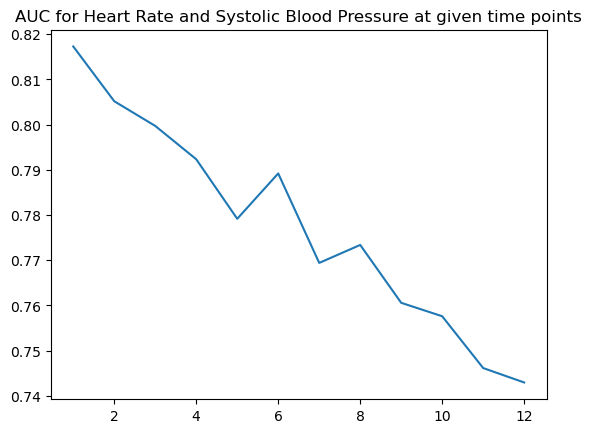

In [70]:
fig, ax = plt.subplots()
ax.plot(timepoints, AUCs)
plt.title("AUC for Heart Rate and Systolic Blood Pressure at given time points")

### HR & Spo2

In [71]:
os.makedirs("results/HR_SPO2/", exist_ok=True)
timepoints, AUCs = cal_mortality(
    hr_events_with_admissions, spo2_events_with_admissions, dst_dir="results/HR_SPO2/",
    time=1, time_window_width=6, max_time=12, time_step=1, M1_name="HR", M2_name="SPO2")

Text(0.5, 1.0, 'AUC for Heart Rate and SpO2 at given time points')

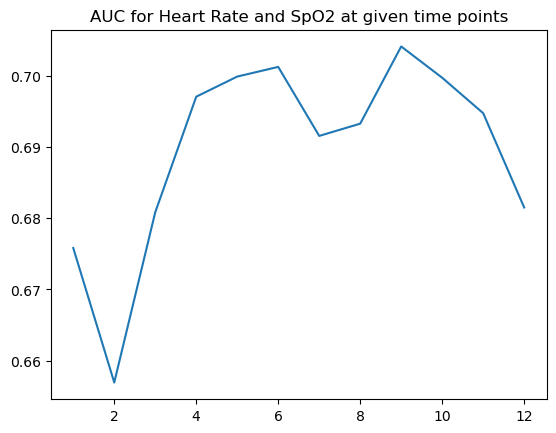

In [ ]:
fig, ax = plt.subplots()
ax.plot(timepoints, AUCs)
plt.title("AUC for Heart Rate and SpO2 at given time points")

### HR & Temperature

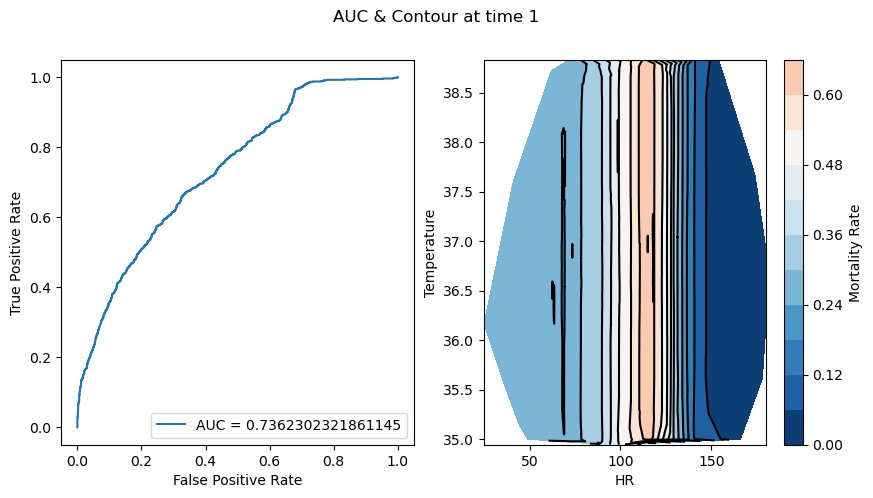

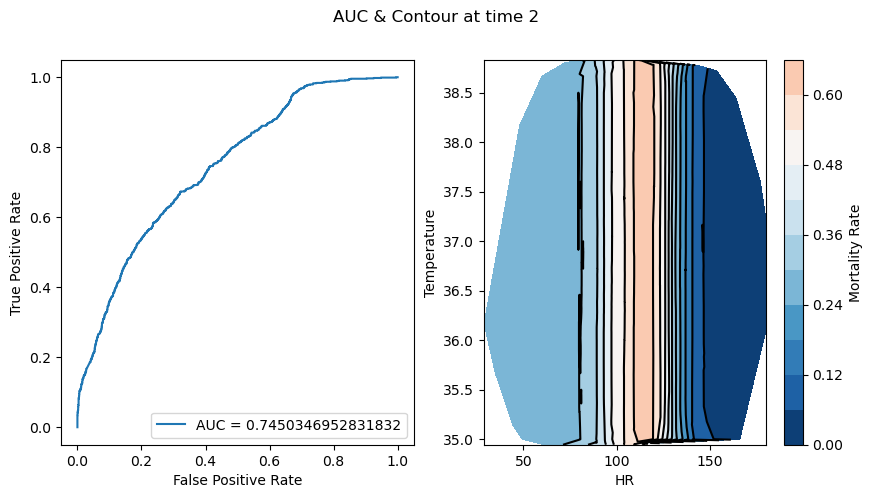

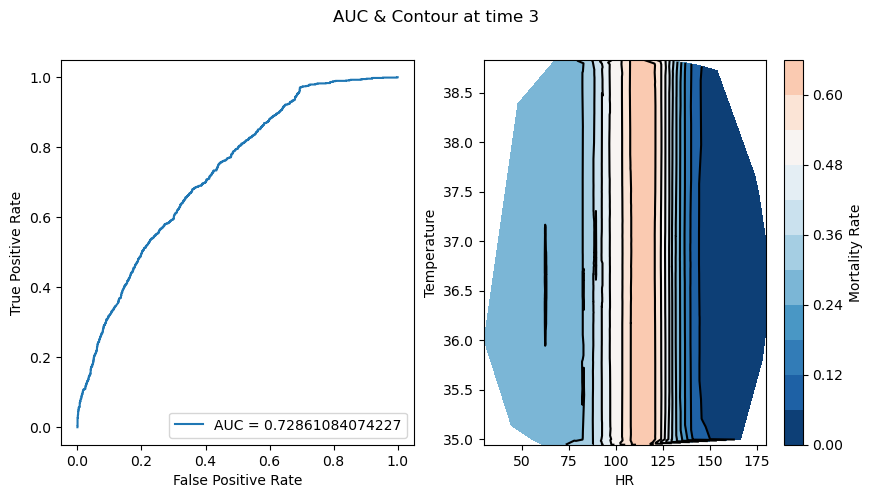

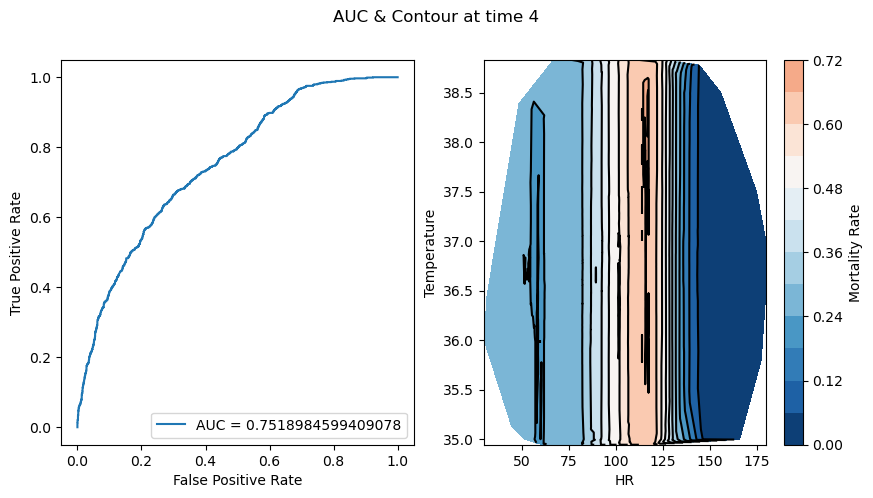

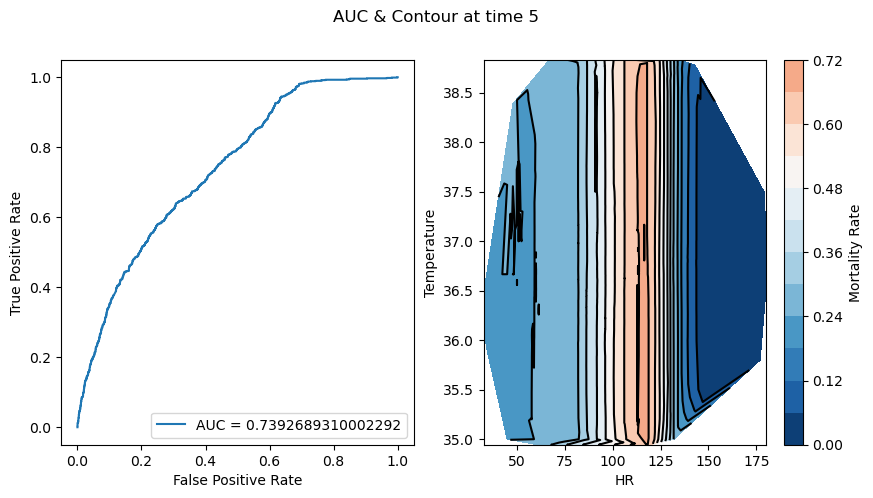

...

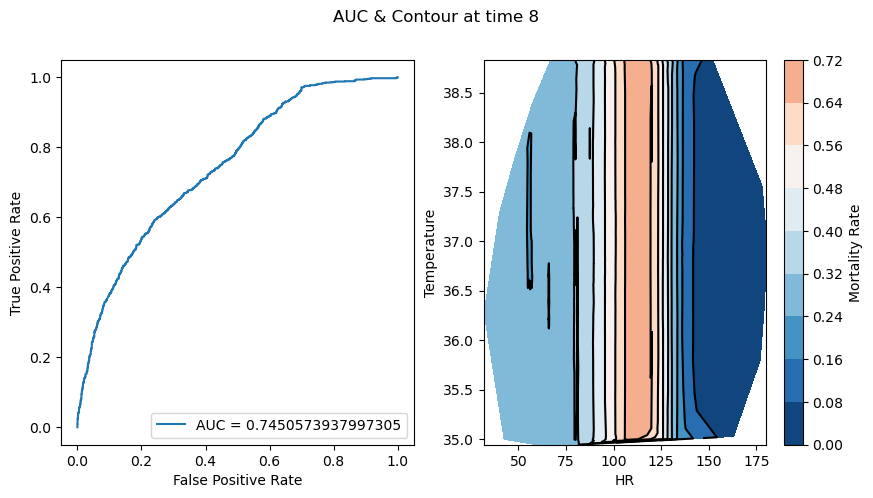

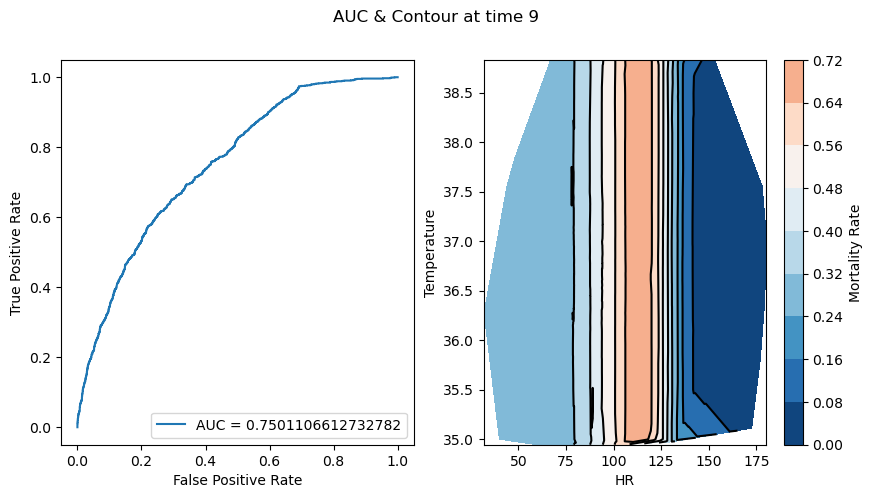

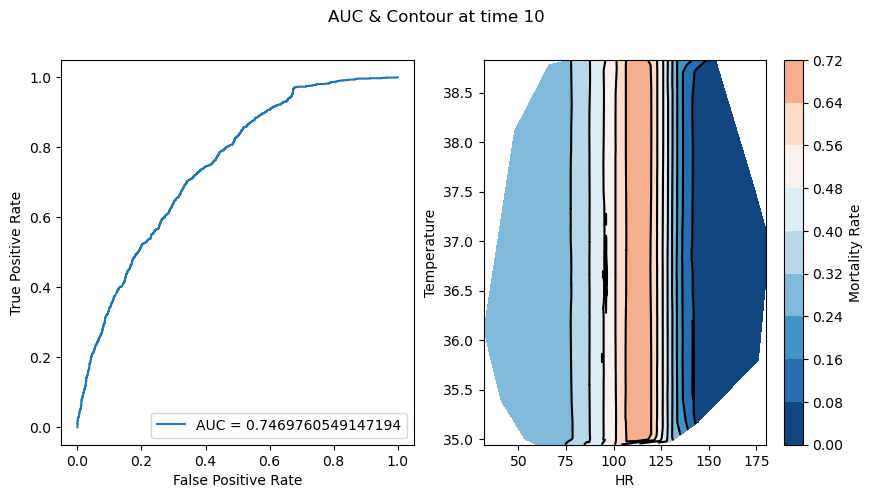

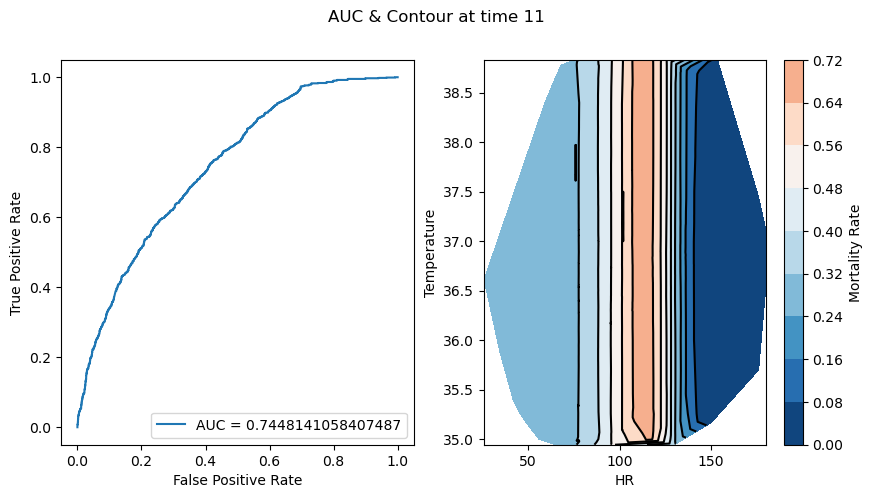

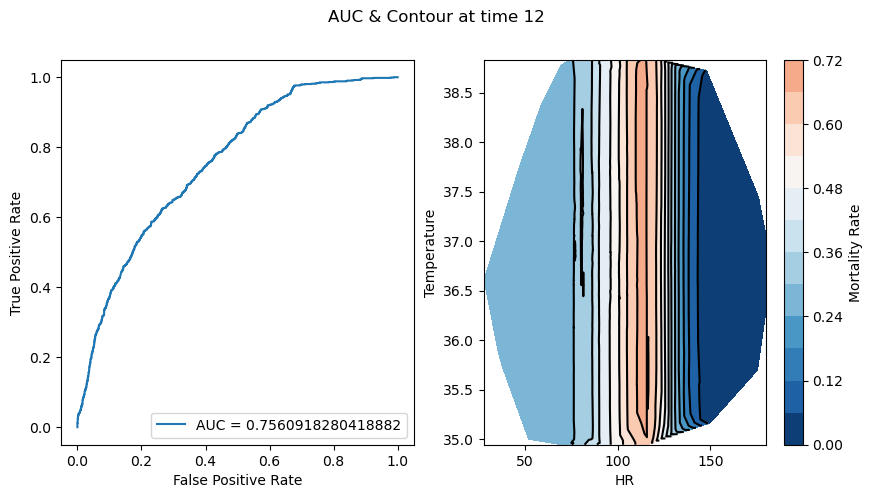

In [ ]:
os.makedirs("results/HR_TEMP/", exist_ok=True)
timepoints, AUCs = cal_mortality(
    hr_events_with_admissions, temperature_events_with_admissions, dst_dir="results/HR_TEMP/",
    time=1, time_window_width=6, max_time=12, time_step=1, M1_name="HR", M2_name="Temperature")

Text(0.5, 1.0, 'AUC for Heart Rate and Temperature at given time points')

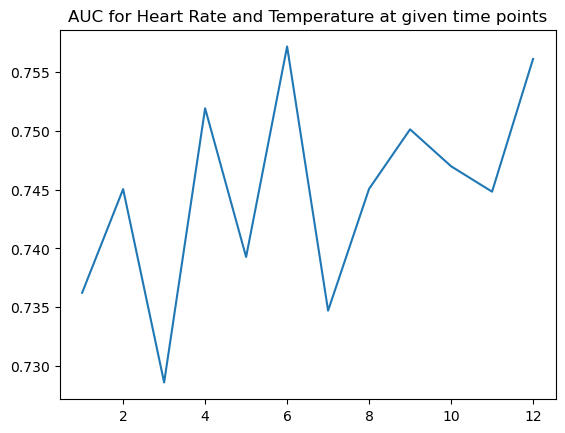

In [ ]:
fig, ax = plt.subplots()
ax.plot(timepoints, AUCs)
plt.title("AUC for Heart Rate and Temperature at given time points")

### HR & RR

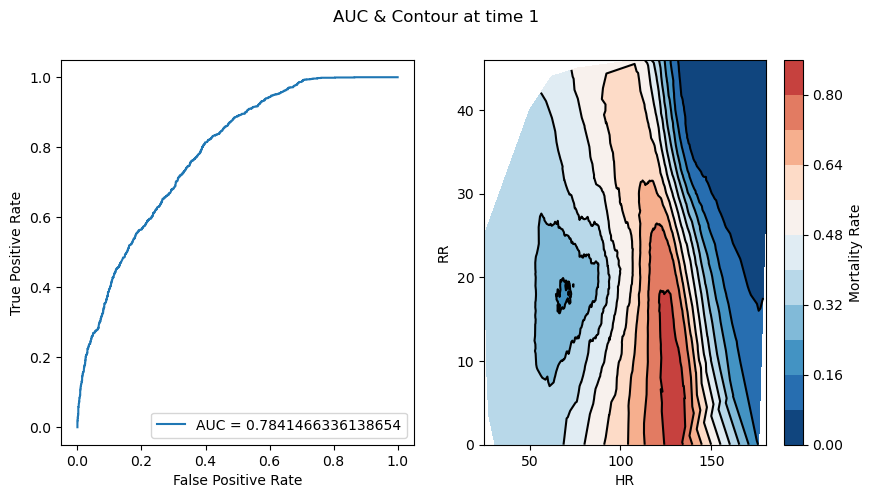

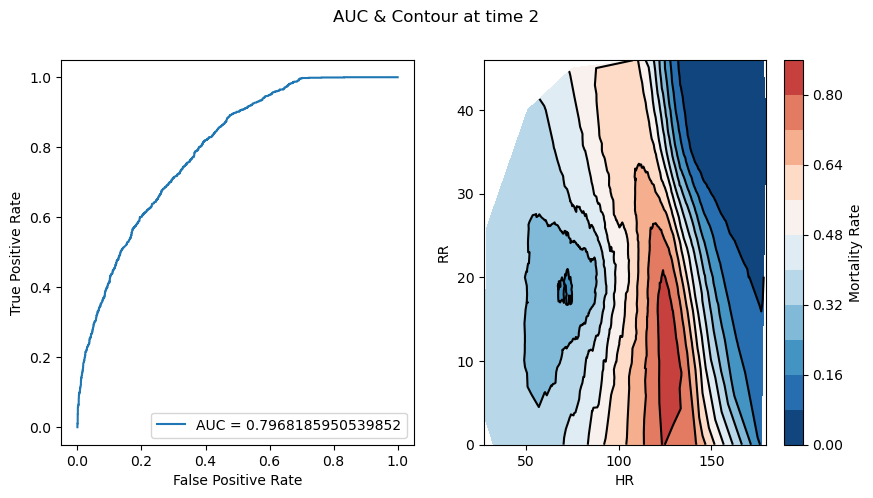

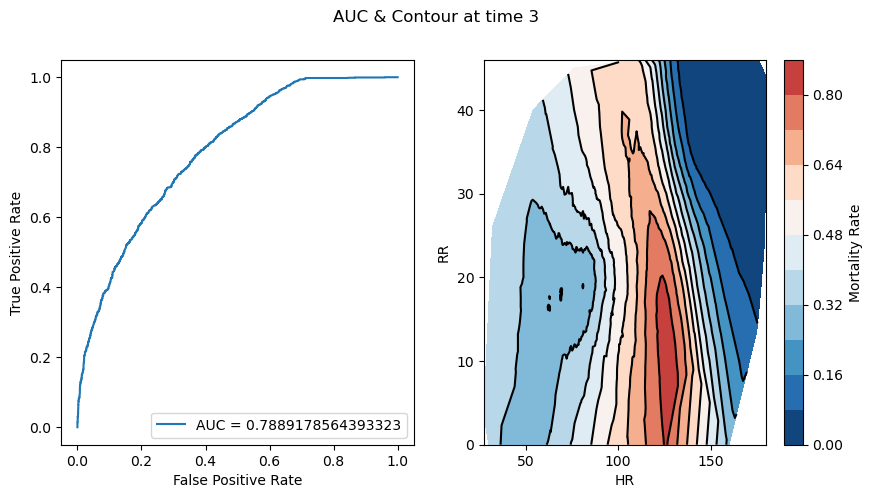

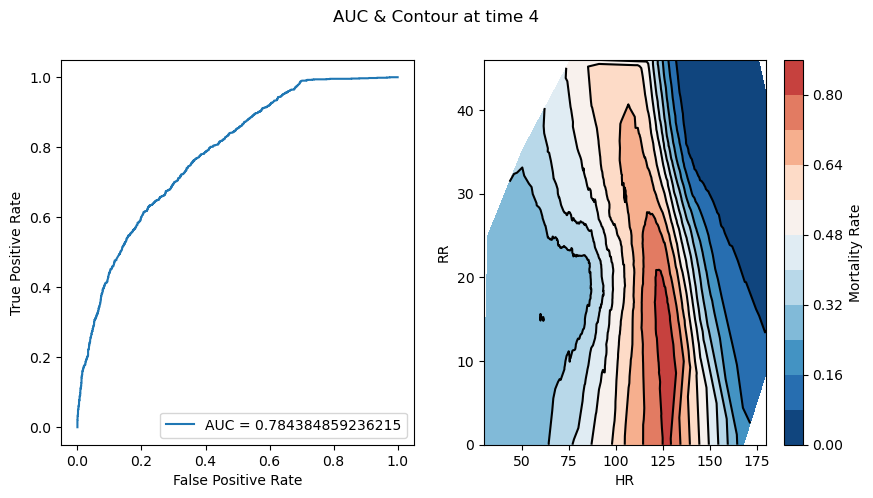

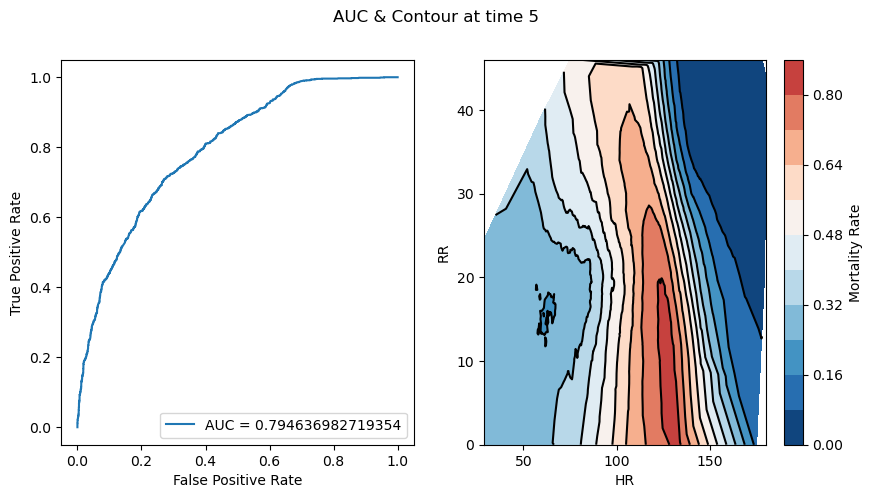

...

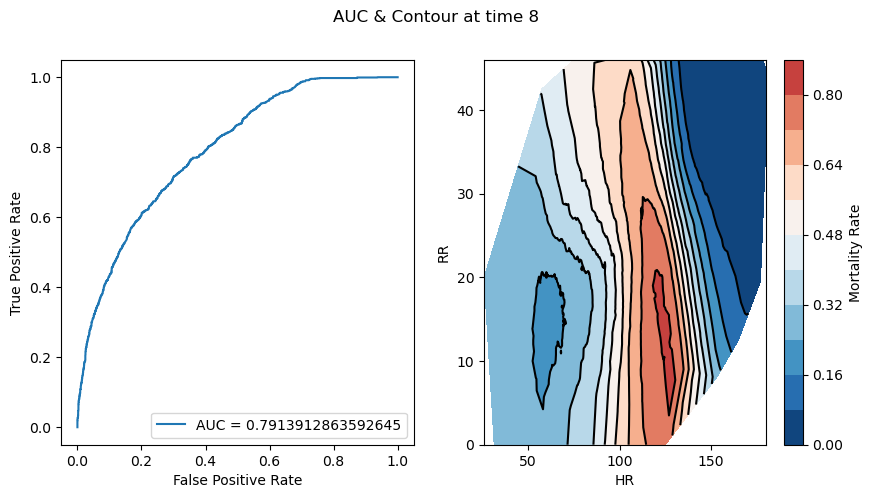

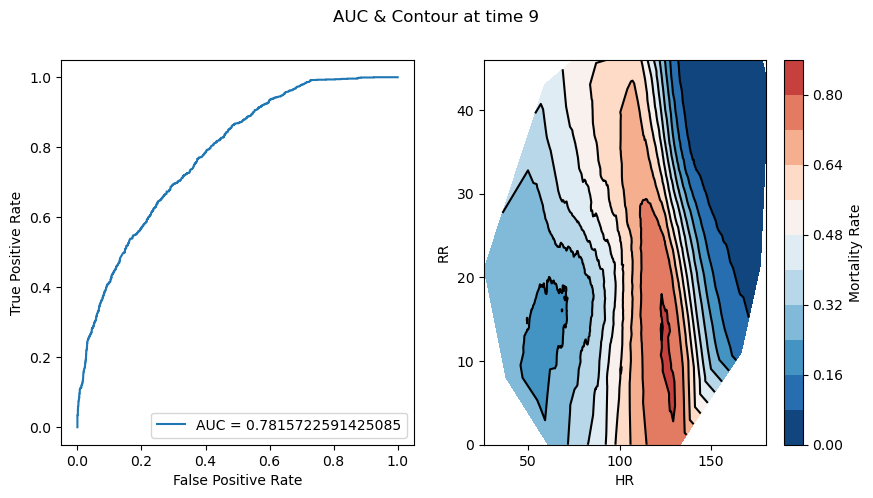

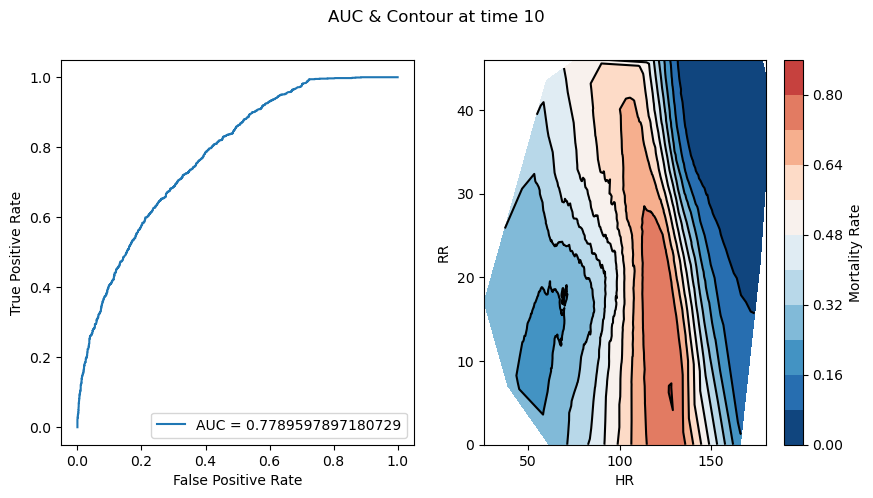

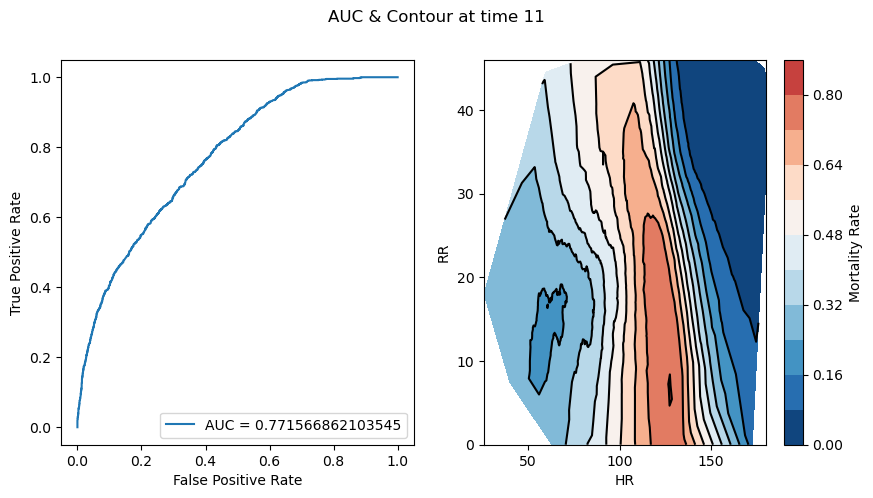

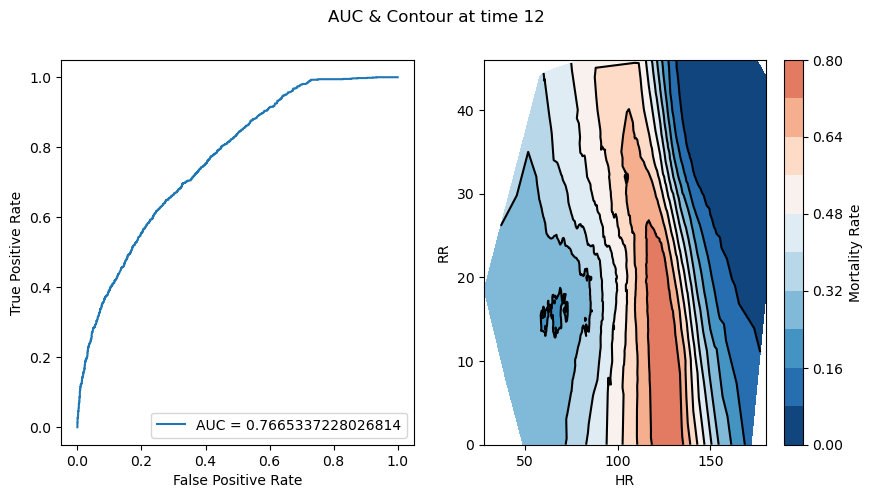

In [ ]:
os.makedirs("results/HR_RR/", exist_ok=True)
timepoints, AUCs = cal_mortality(
    hr_events_with_admissions, rr_events_with_admissions, dst_dir="results/HR_RR/",
    time=1, time_window_width=6, max_time=12, time_step=1, M1_name="HR", M2_name="RR")

Text(0.5, 1.0, 'AUC for Heart Rate and Respiratory Rate at given time points')

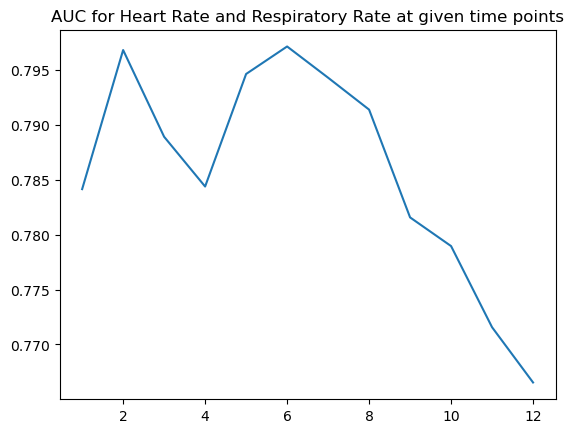

In [ ]:
fig, ax = plt.subplots()
ax.plot(timepoints, AUCs)
plt.title("AUC for Heart Rate and Respiratory Rate at given time points")

### SBP & Spo2

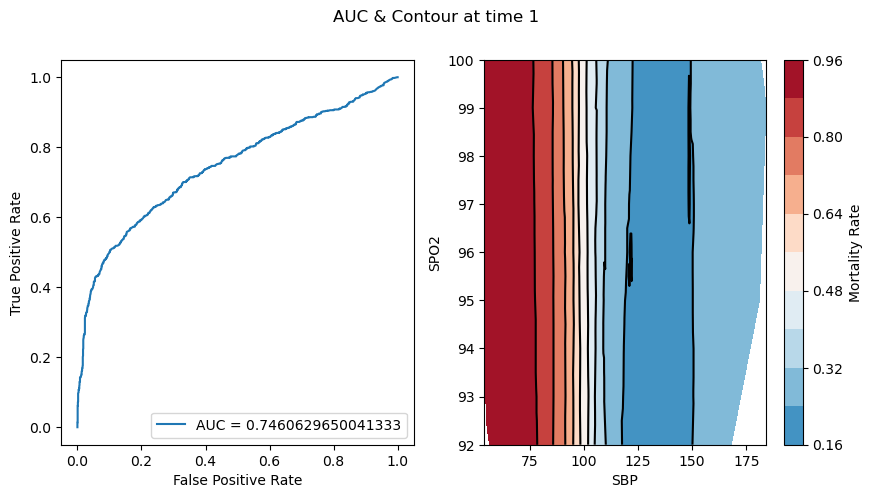

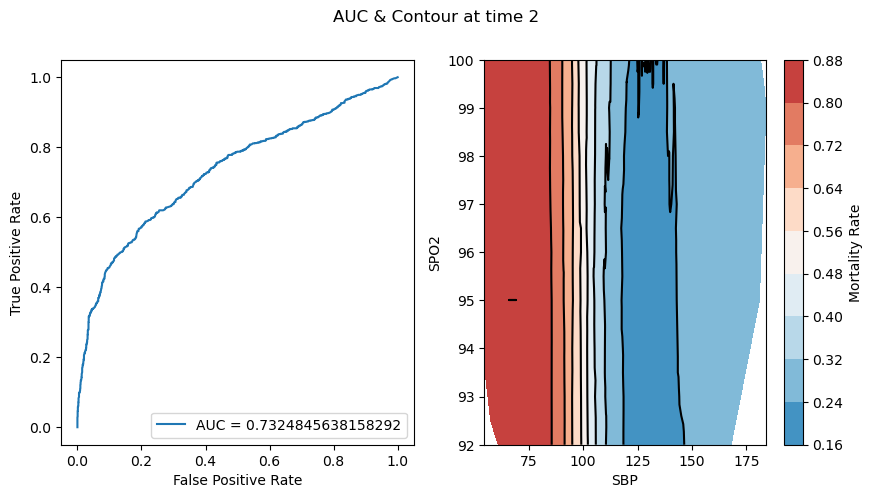

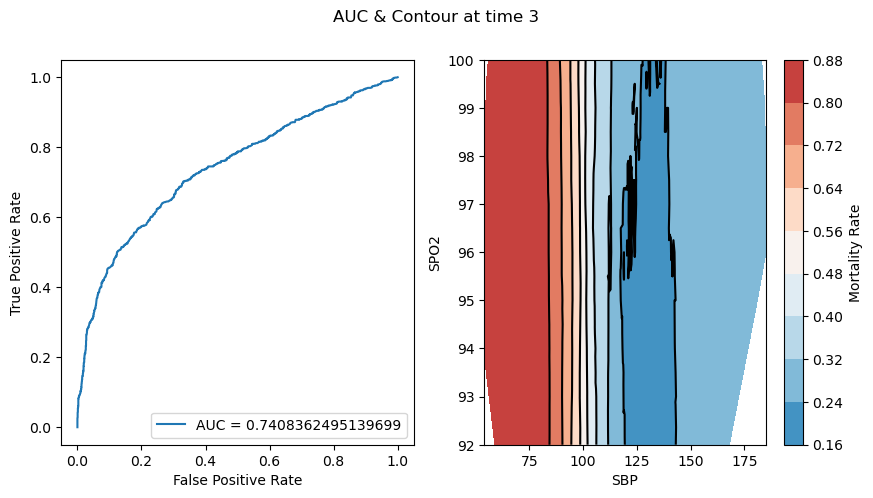

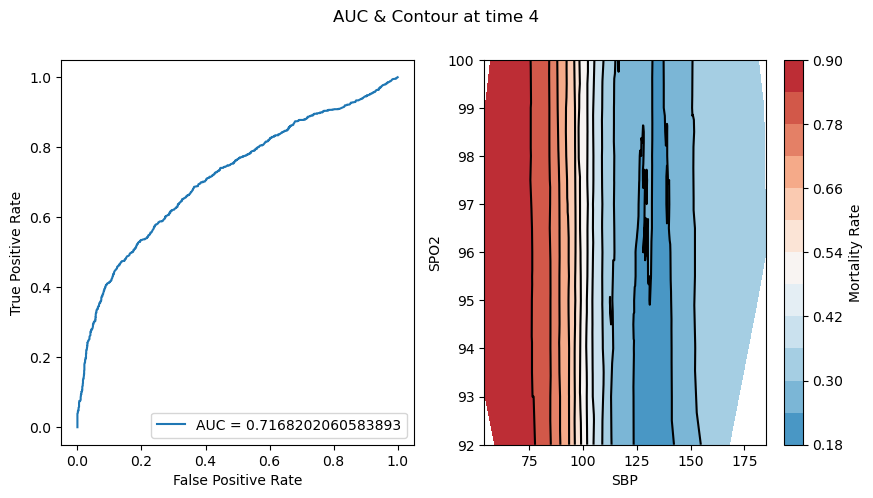

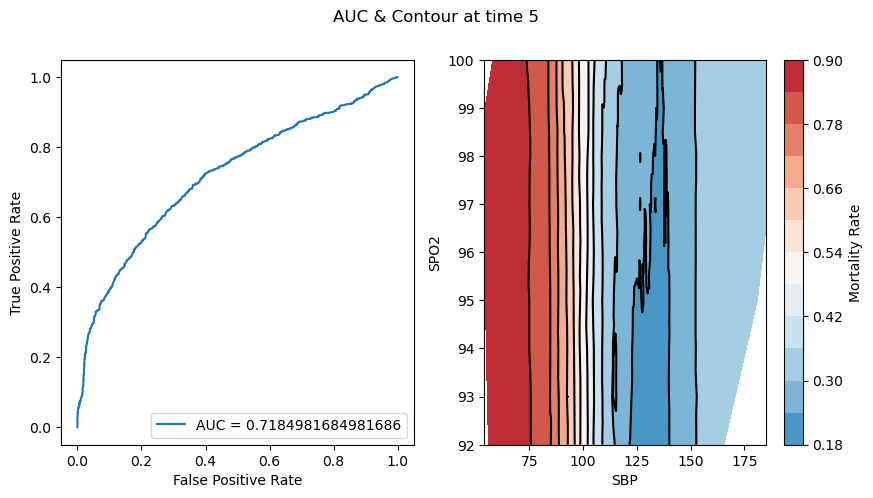

...

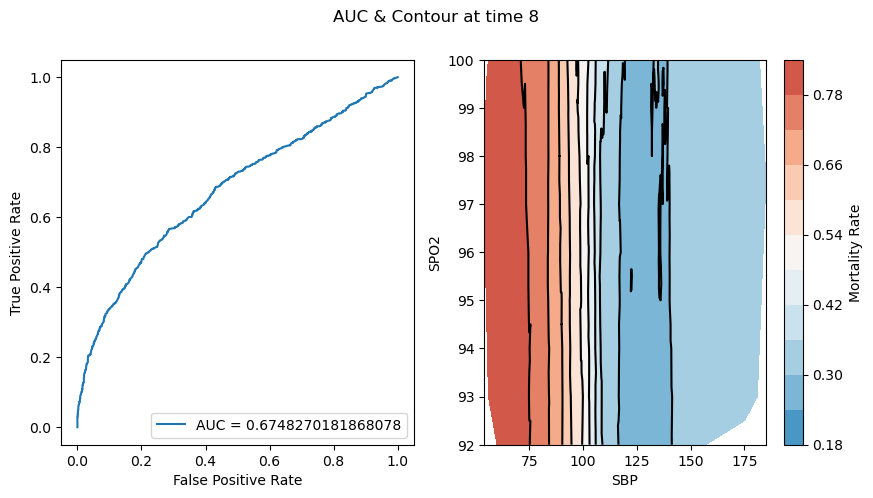

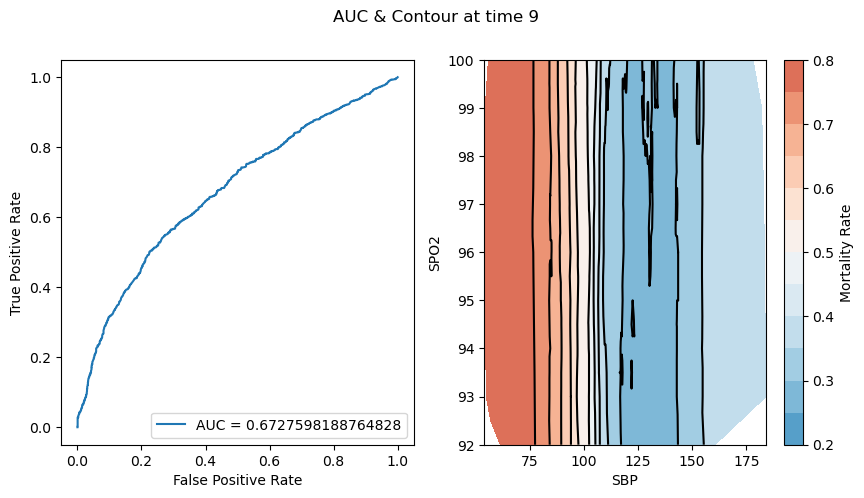

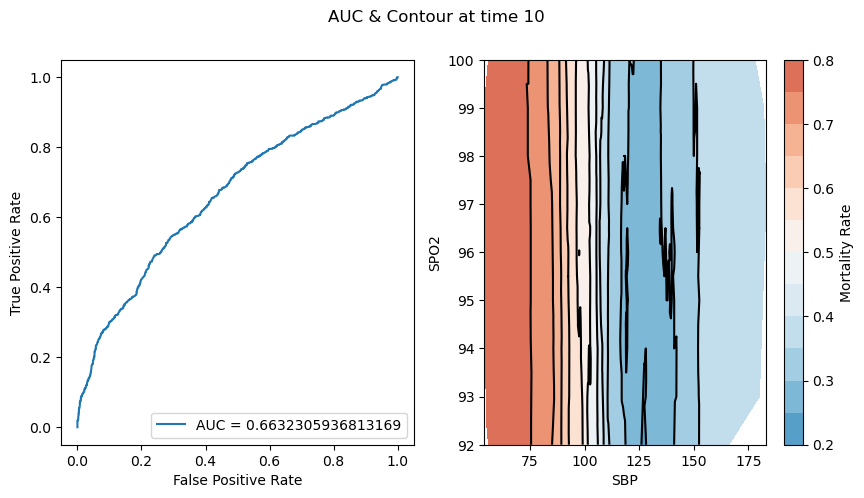

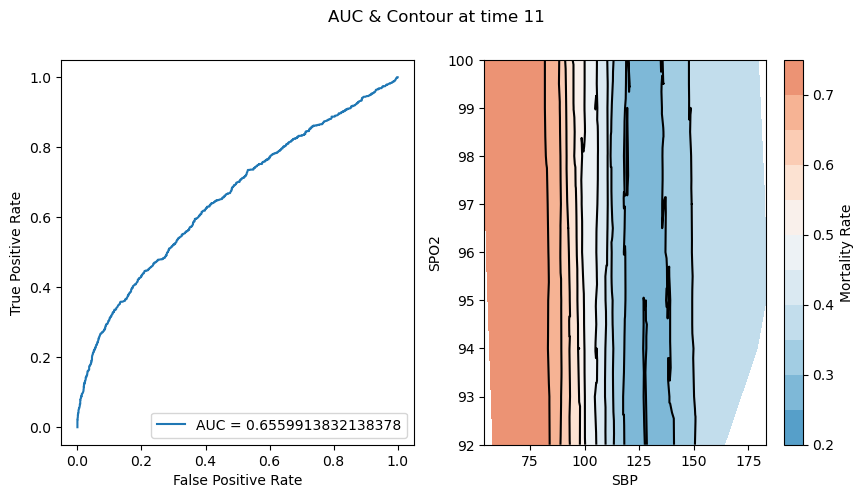

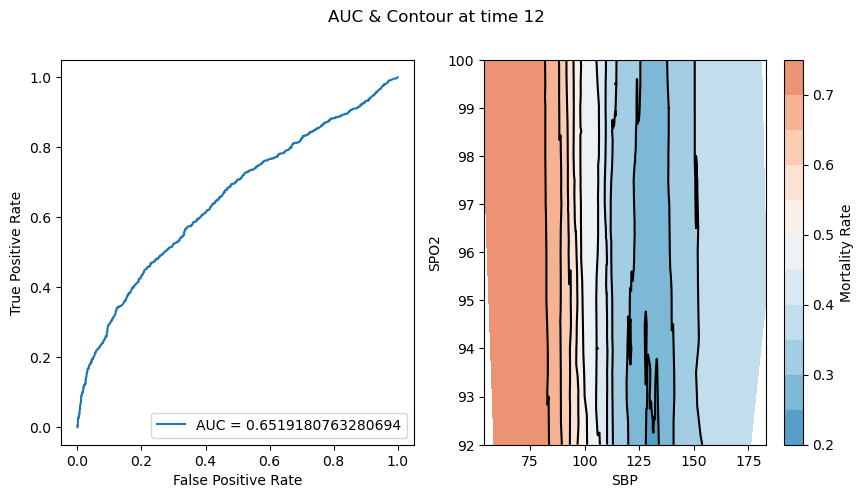

In [ ]:
os.makedirs("results/SBP_SPO2/", exist_ok=True)
timepoints, AUCs = cal_mortality(
    sbp_events_with_admissions, spo2_events_with_admissions, dst_dir="results/SBP_SPO2/",
    time=1, time_window_width=6, max_time=12, time_step=1, M1_name="SBP", M2_name="SPO2")

Text(0.5, 1.0, 'AUC for Systolic Blood Pressure and SpO2 at given time points')

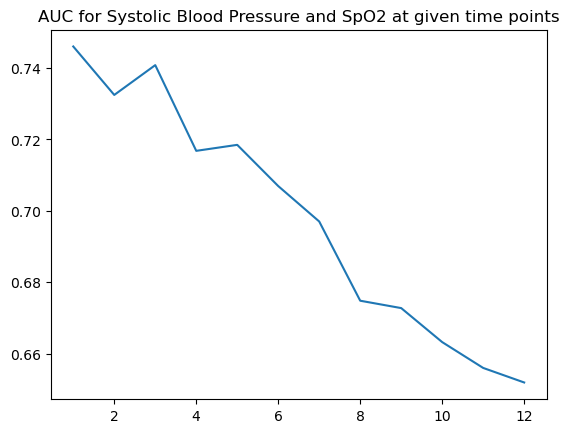

In [ ]:
fig, ax = plt.subplots()
ax.plot(timepoints, AUCs)
plt.title("AUC for Systolic Blood Pressure and SpO2 at given time points")

### SBP & Temperature

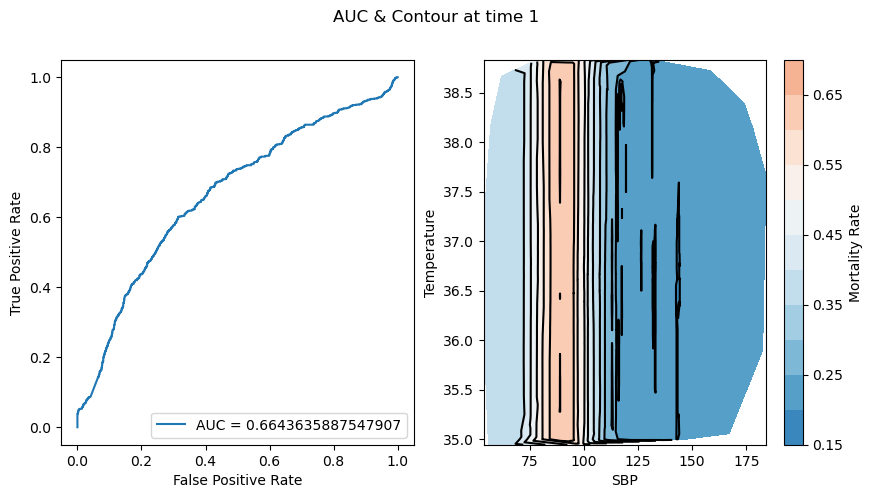

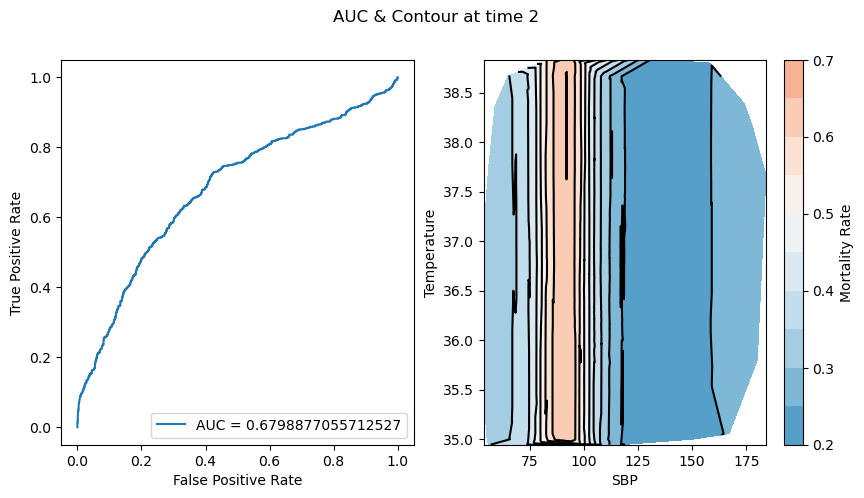

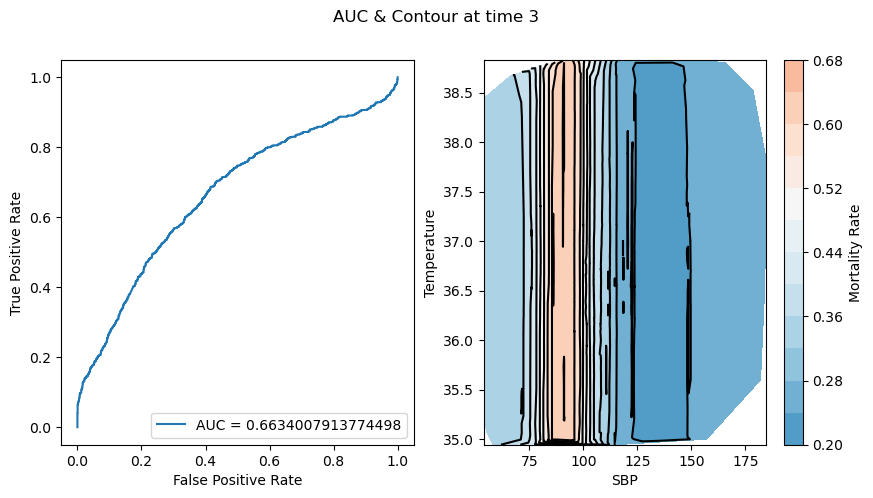

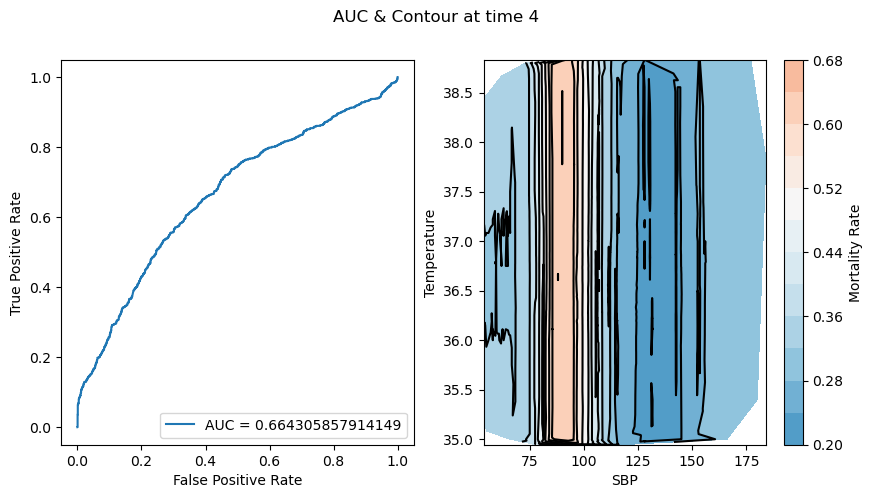

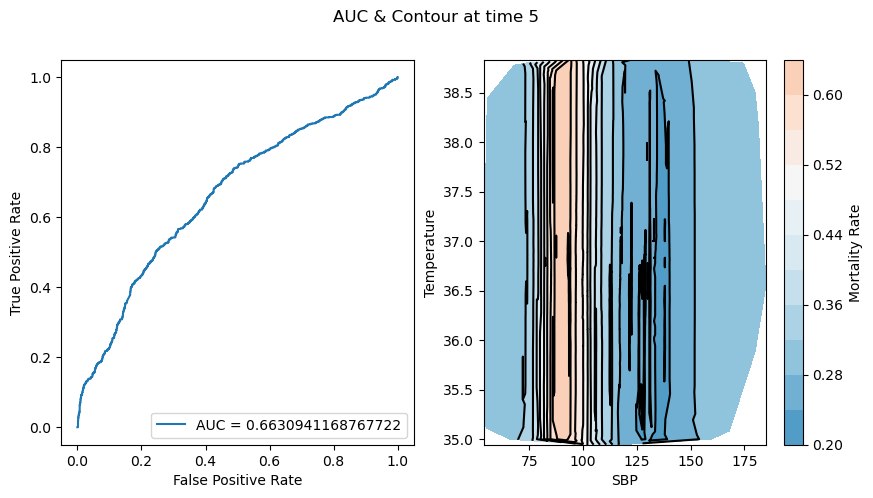

...

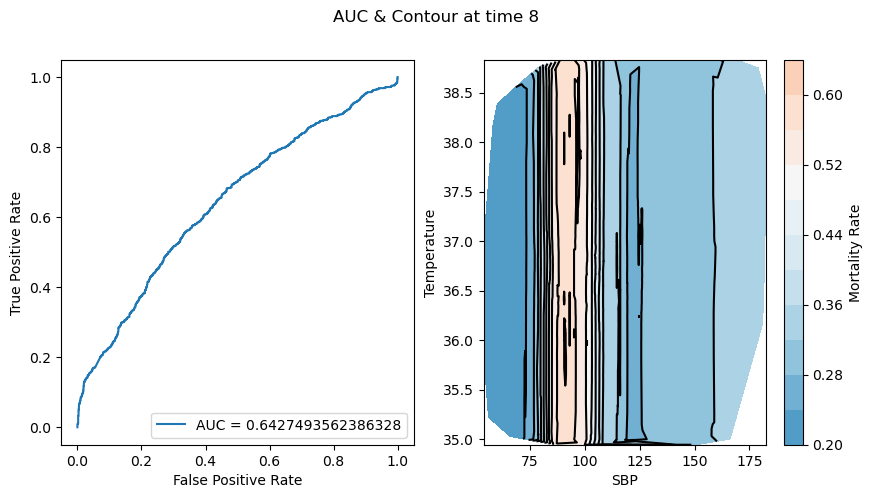

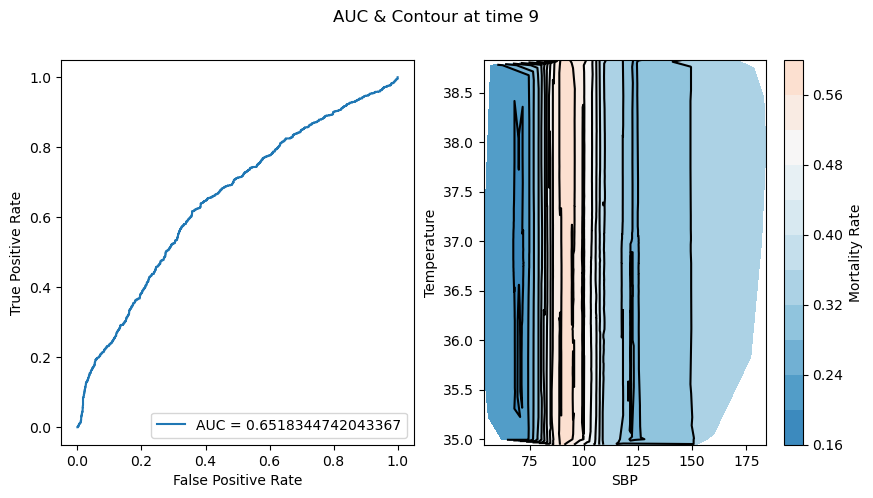

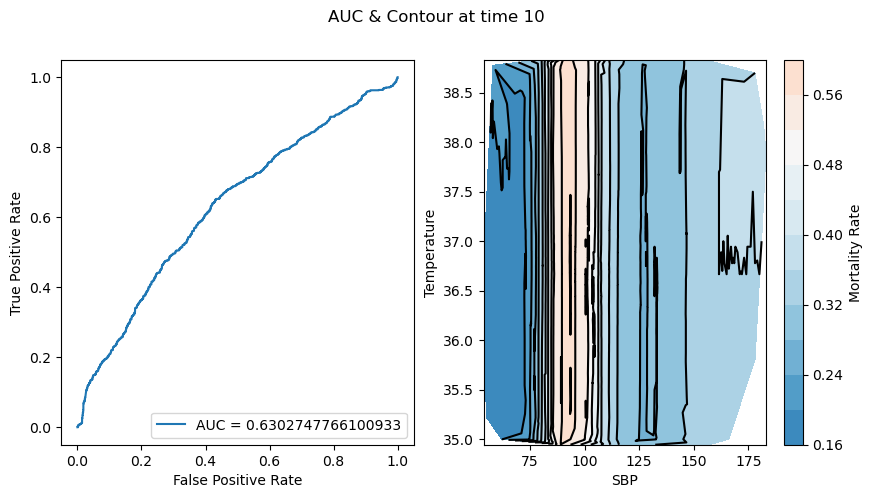

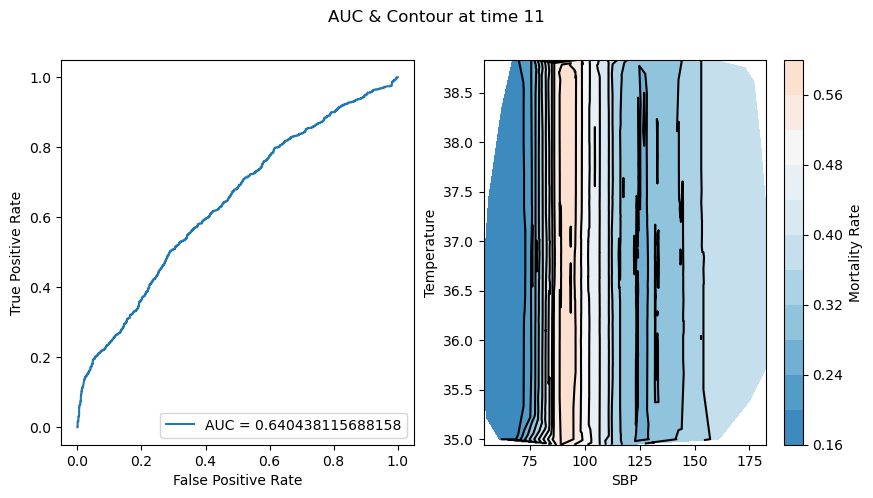

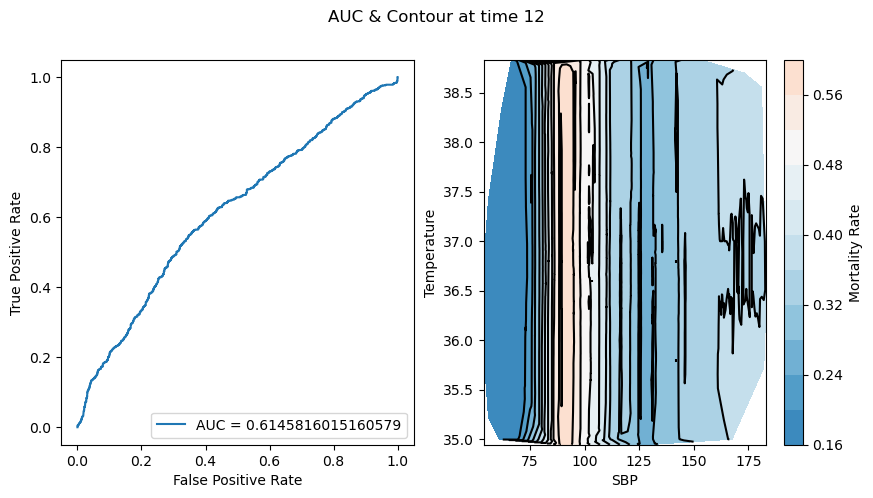

In [ ]:
os.makedirs("results/SBP_TEMP/", exist_ok=True)
timepoints, AUCs = cal_mortality(
    sbp_events_with_admissions, temperature_events_with_admissions, dst_dir="results/SBP_TEMP/",
    time=1, time_window_width=6, max_time=12, time_step=1, M1_name="SBP", M2_name="Temperature")

Text(0.5, 1.0, 'AUC for Systolic Blood Pressure and Temperature at given time points')

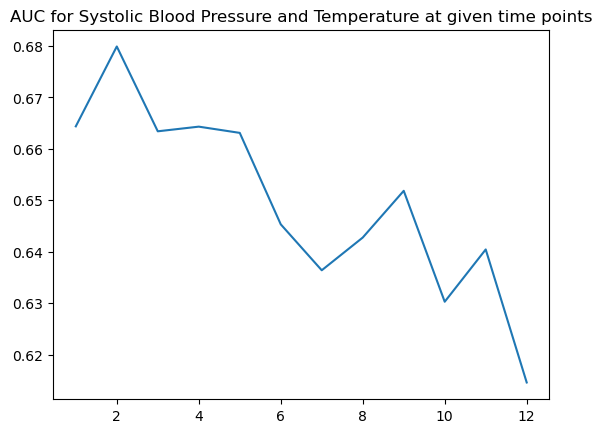

In [ ]:
fig, ax = plt.subplots()
ax.plot(timepoints, AUCs)
plt.title("AUC for Systolic Blood Pressure and Temperature at given time points")

### SBP & RR

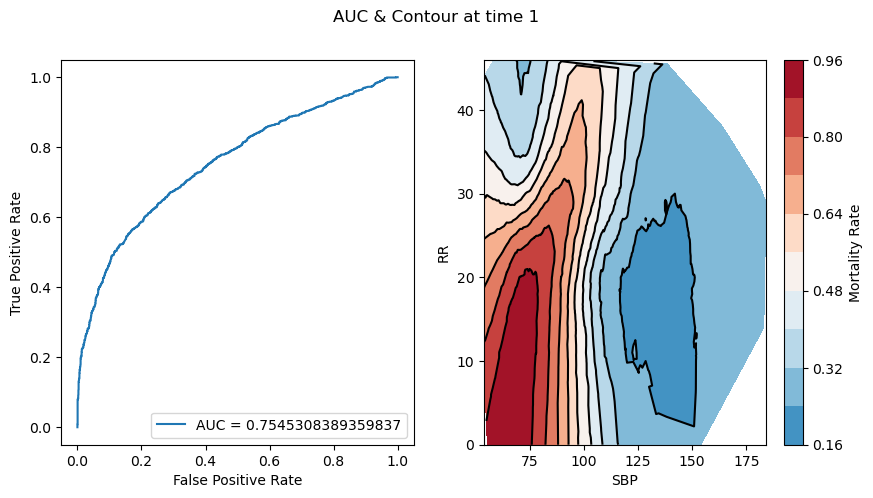

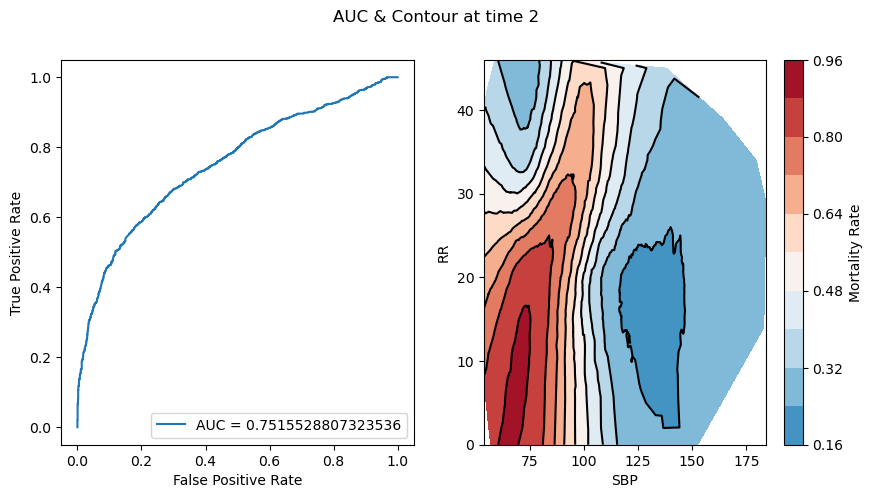

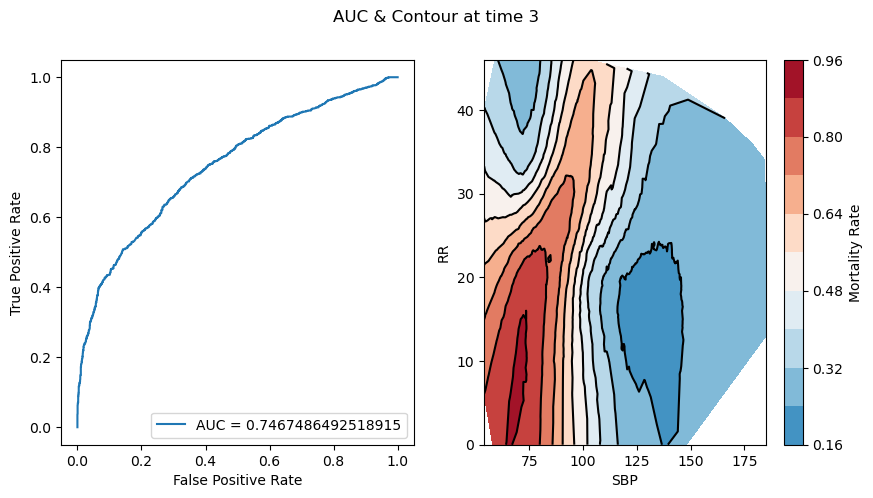

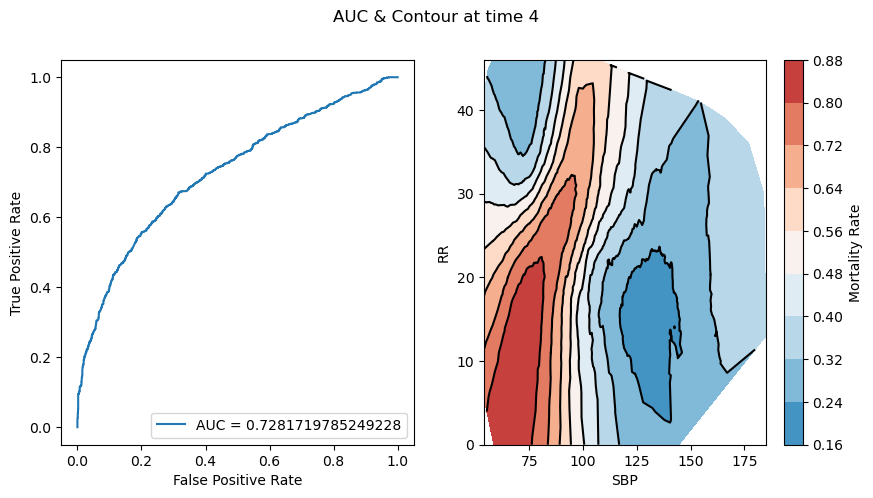

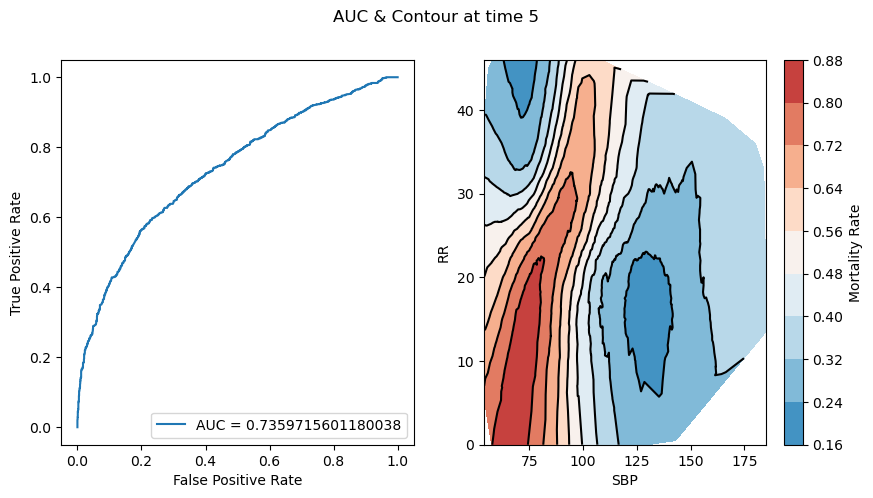

...

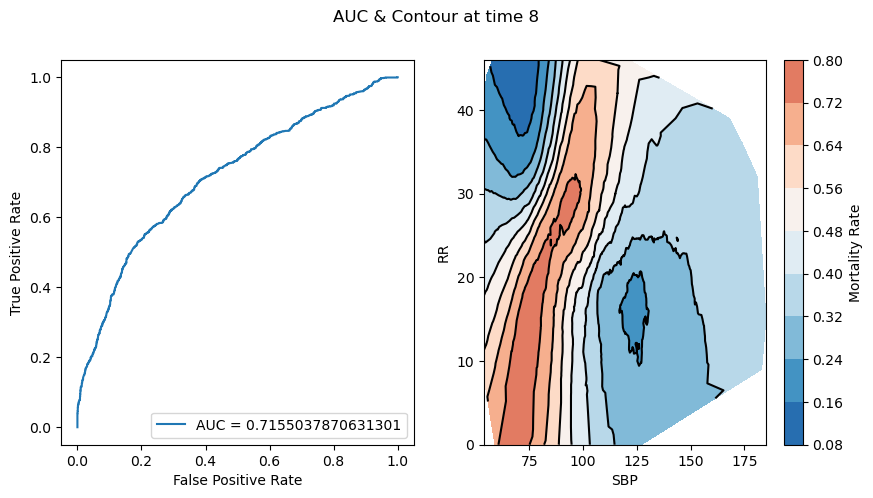

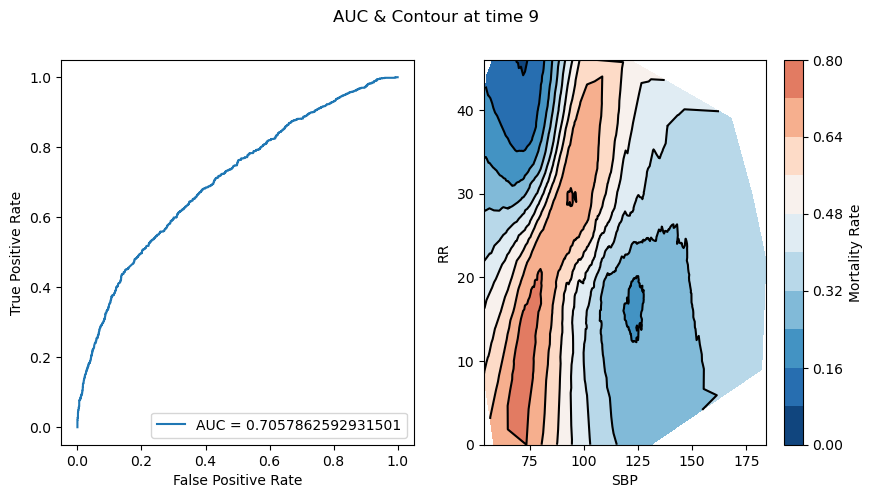

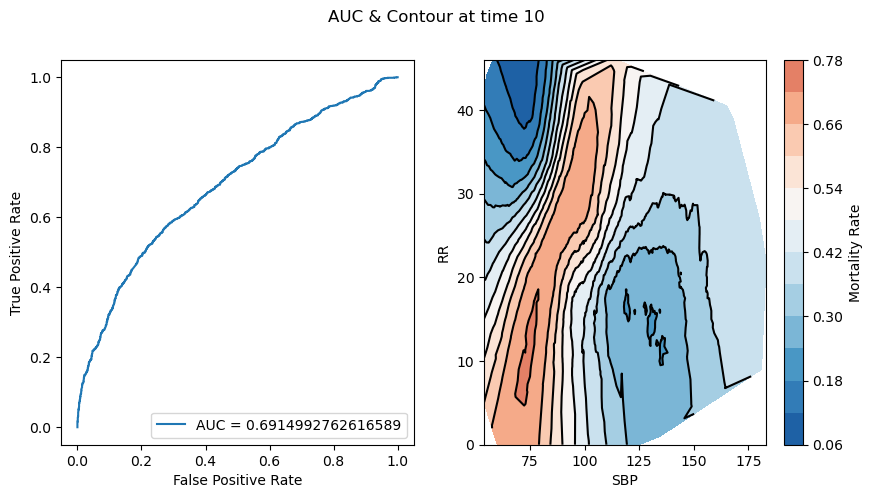

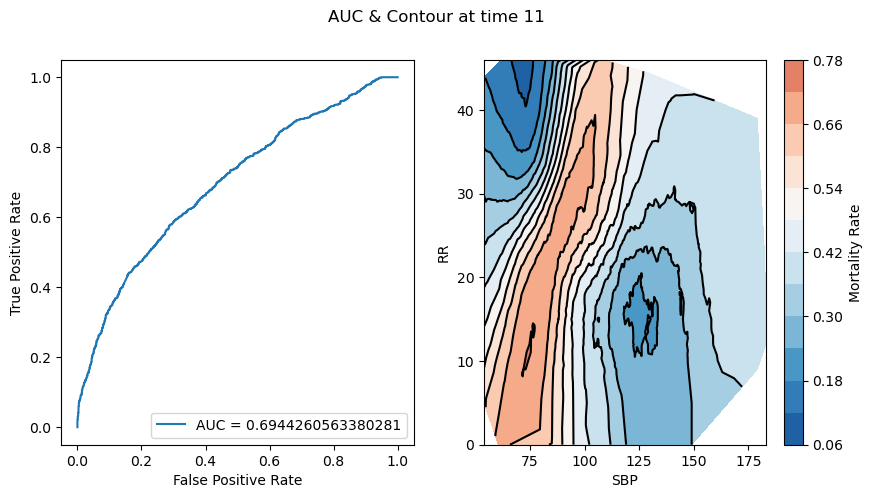

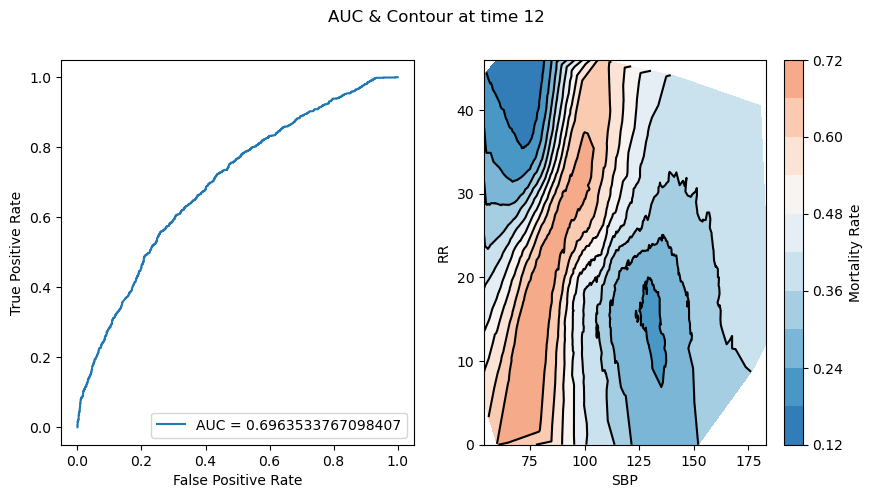

In [ ]:
os.makedirs("results/SBP_RR/", exist_ok=True)
timepoints, AUCs = cal_mortality(
    sbp_events_with_admissions, rr_events_with_admissions, dst_dir="results/SBP_RR/",
    time=1, time_window_width=6, max_time=12, time_step=1, M1_name="SBP", M2_name="RR")

Text(0.5, 1.0, 'AUC for Systolic Blood Pressure and Respiratory Rate at given time points')

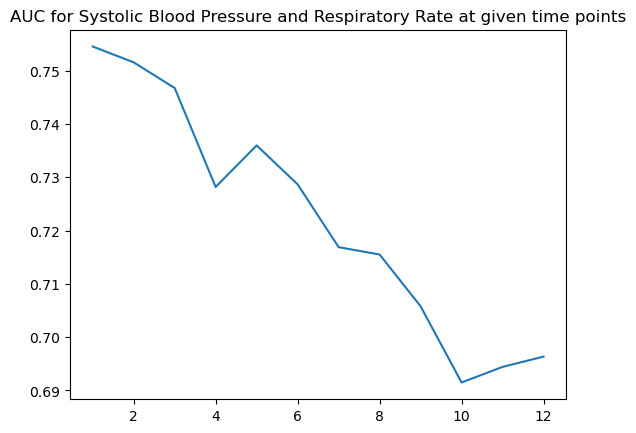

In [ ]:
fig, ax = plt.subplots()
ax.plot(timepoints, AUCs)
plt.title("AUC for Systolic Blood Pressure and Respiratory Rate at given time points")

### Spo2 & Temperature

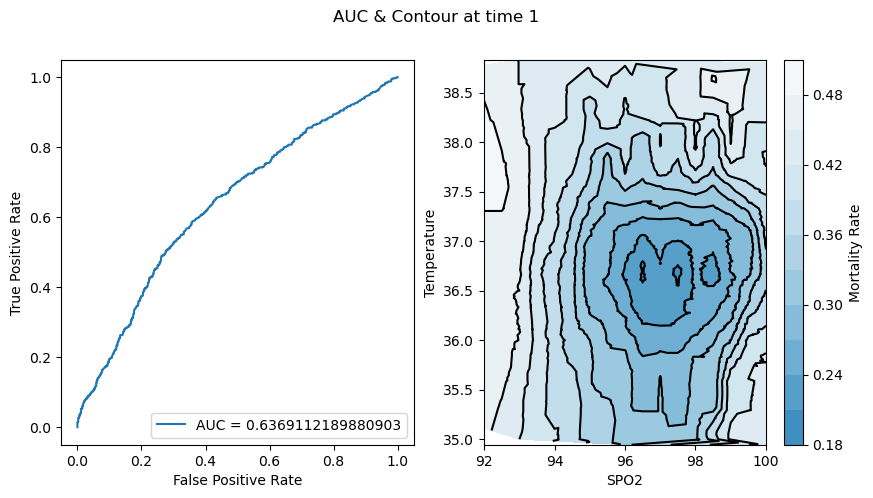

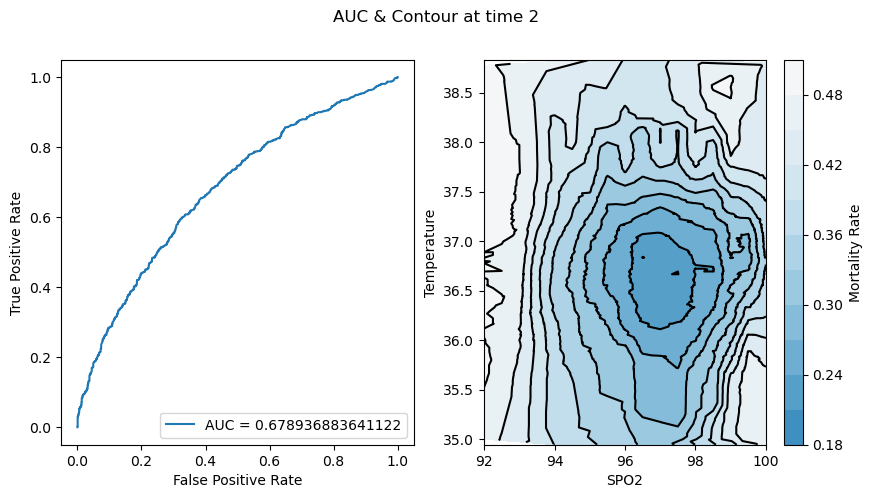

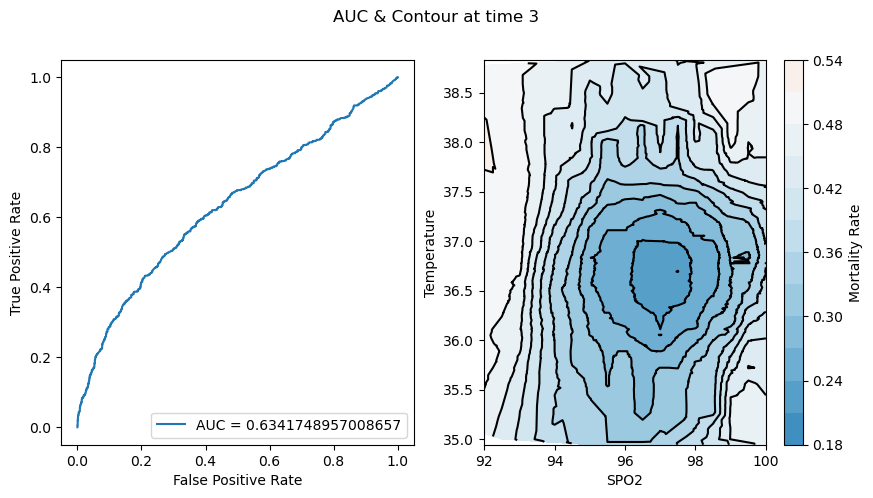

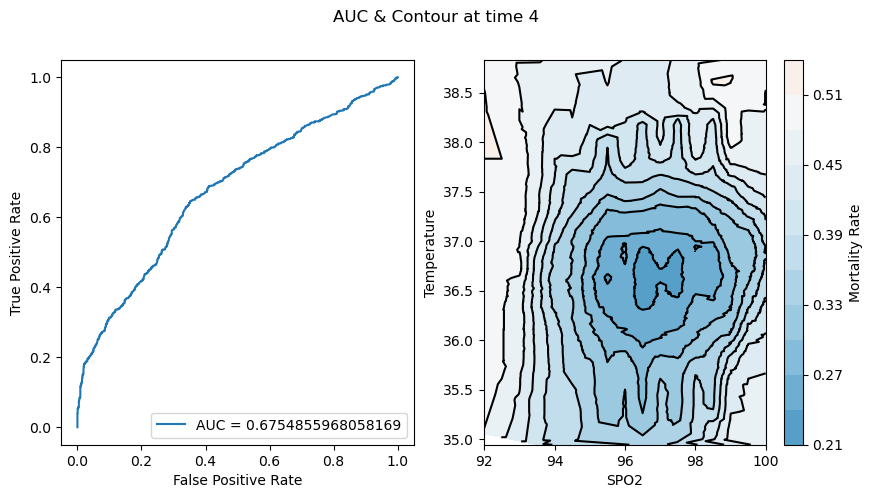

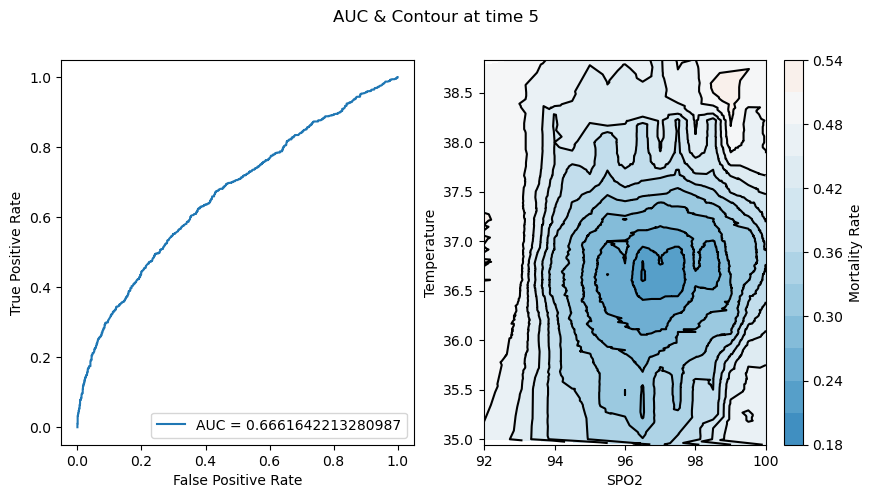

...

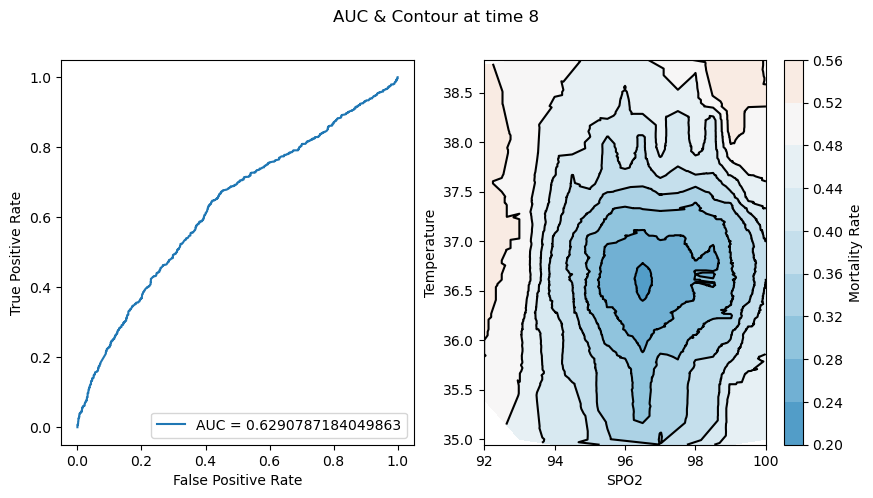

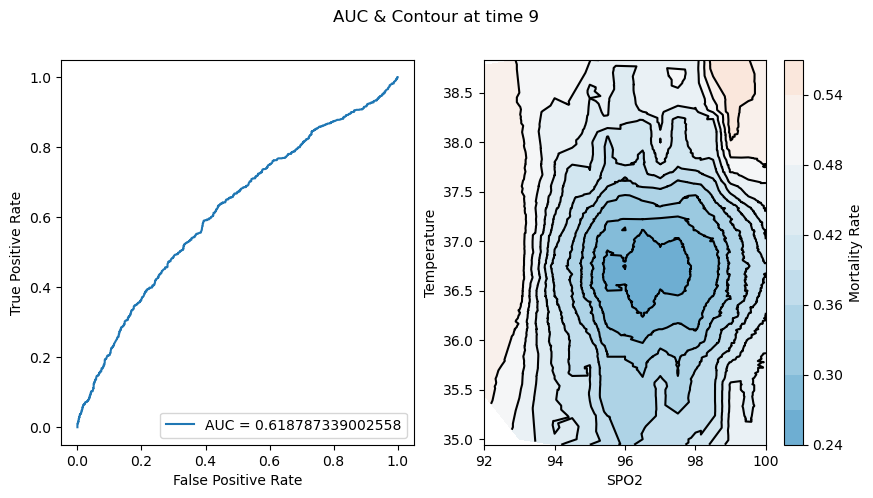

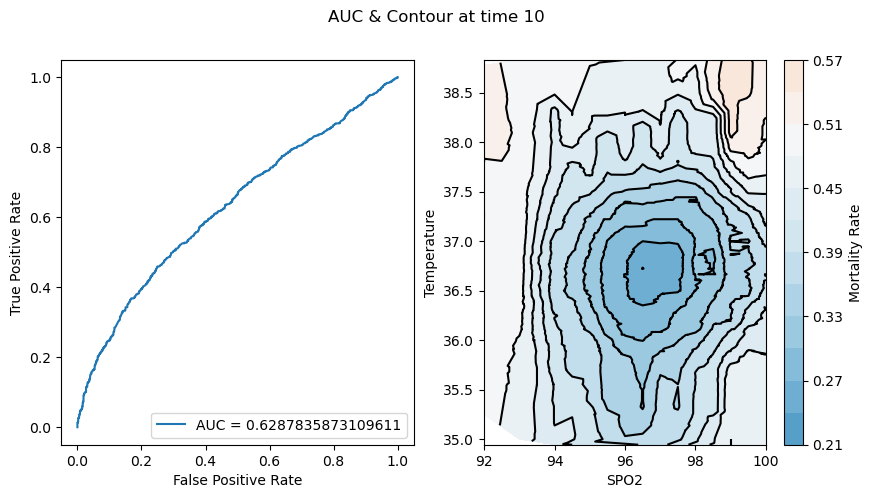

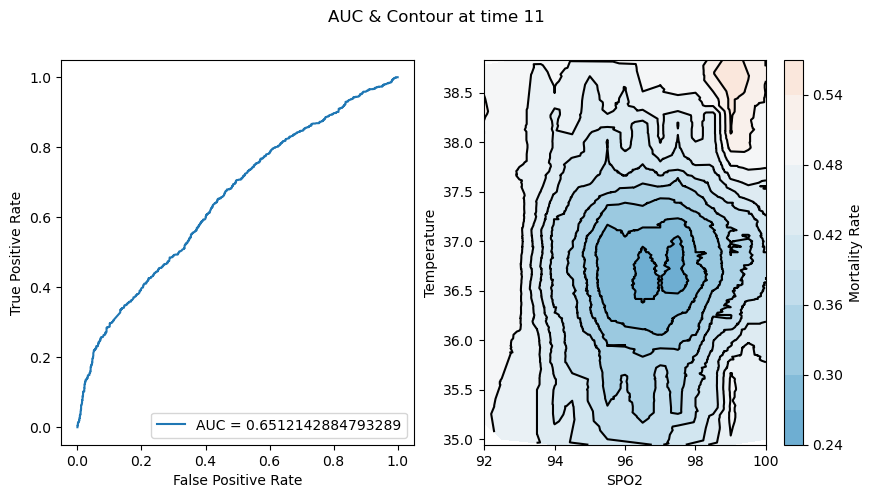

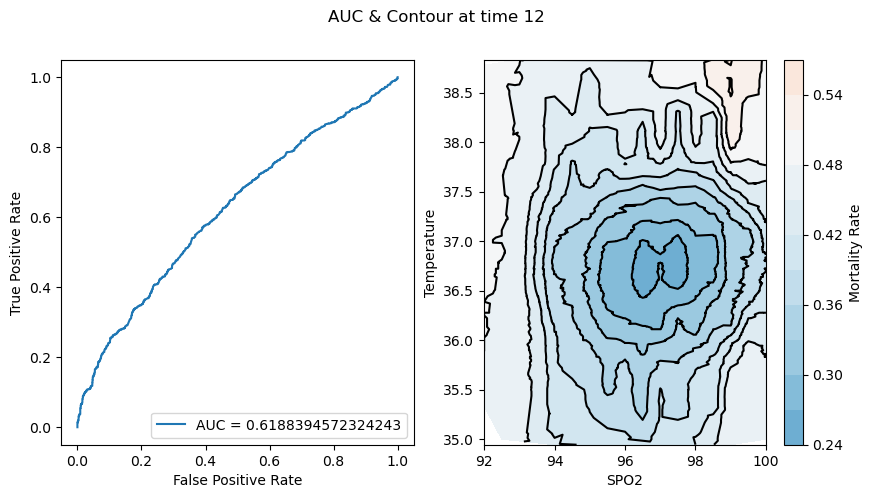

In [ ]:
os.makedirs("results/SPO2_TEMP/", exist_ok=True)
timepoints, AUCs = cal_mortality(
    spo2_events_with_admissions, temperature_events_with_admissions, dst_dir="results/SPO2_TEMP/",
    time=1, time_window_width=6, max_time=12, time_step=1, M1_name="SPO2", M2_name="Temperature")

Text(0.5, 1.0, 'AUC for SpO2 and Temperature at given time points')

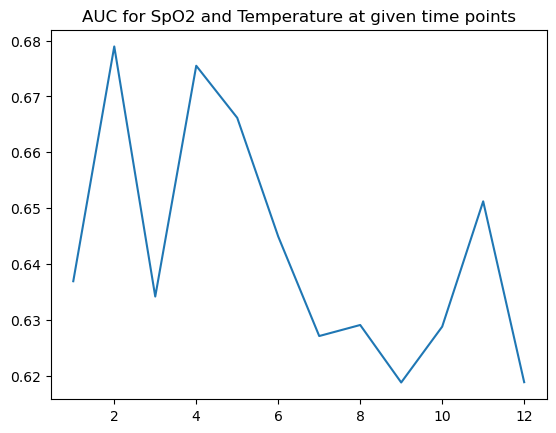

In [ ]:
fig, ax = plt.subplots()
ax.plot(timepoints, AUCs)
plt.title("AUC for SpO2 and Temperature at given time points")

### Spo2 & RR

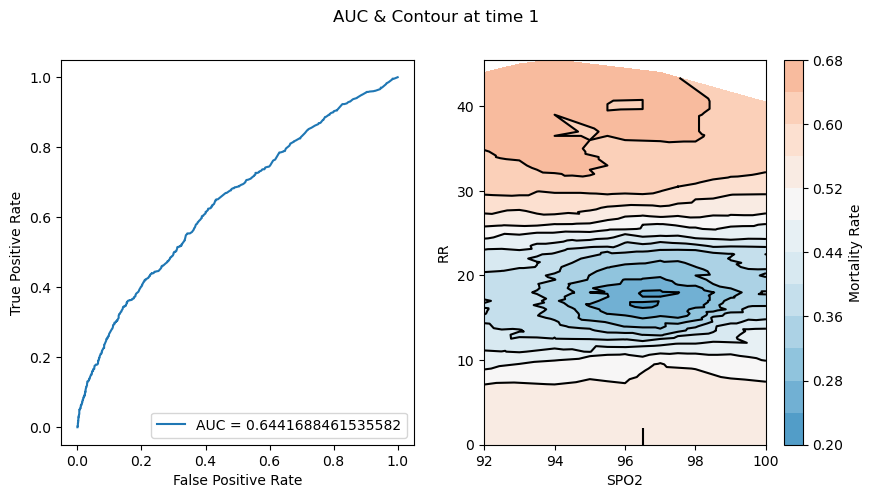

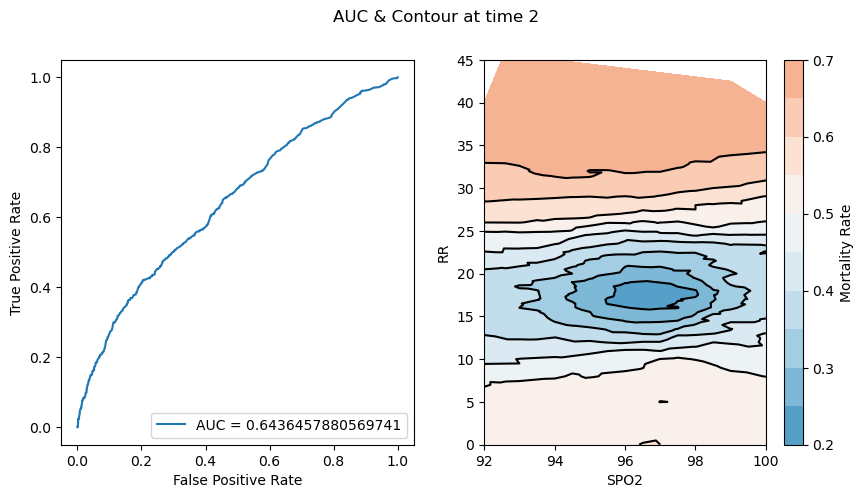

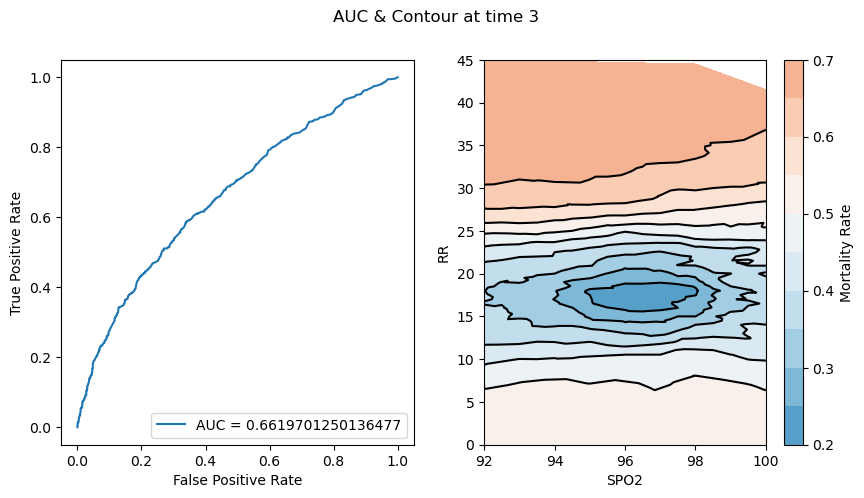

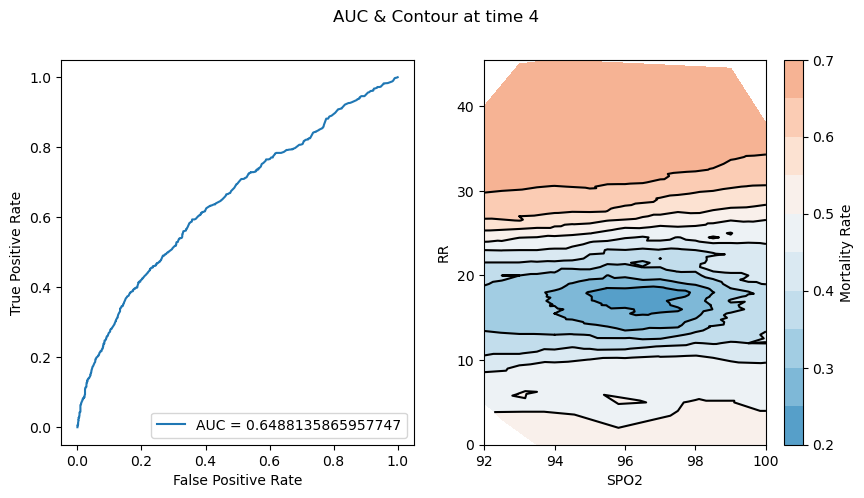

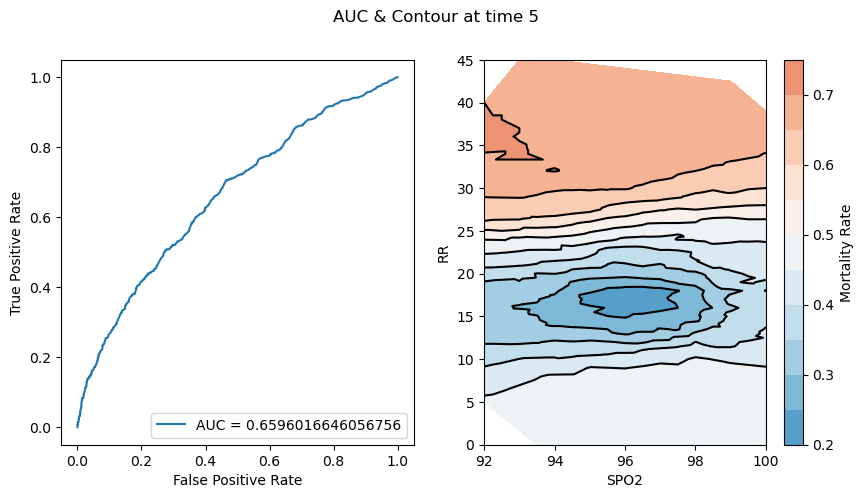

...

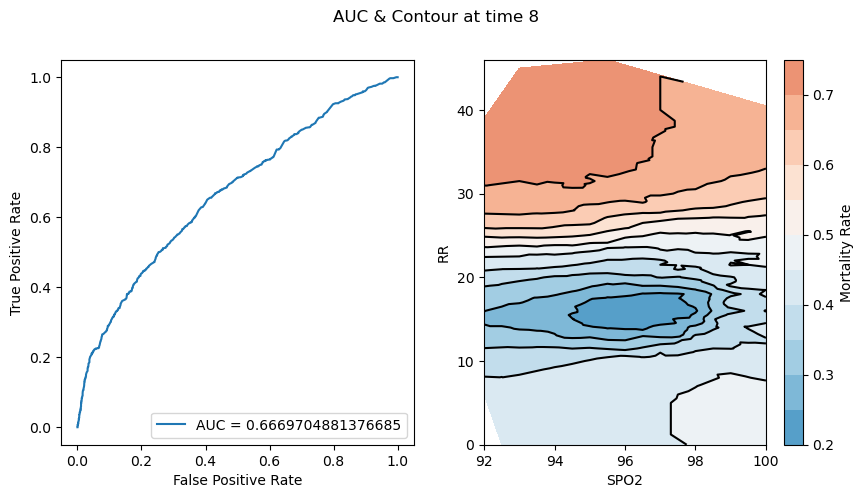

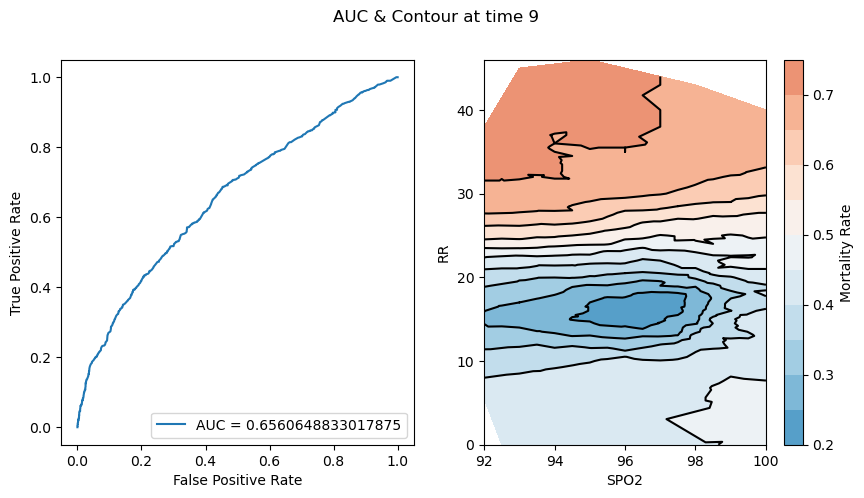

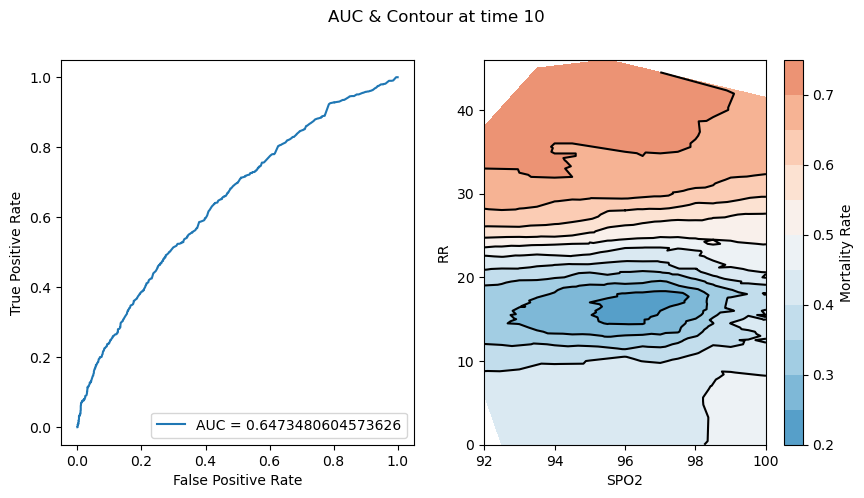

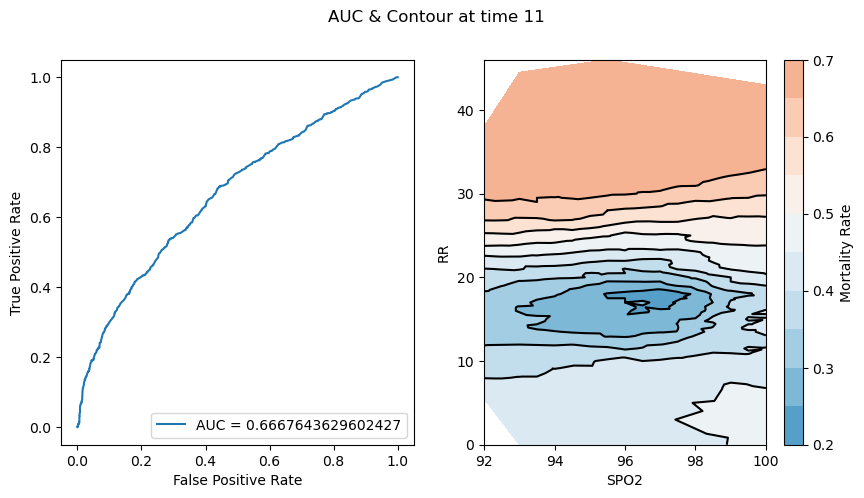

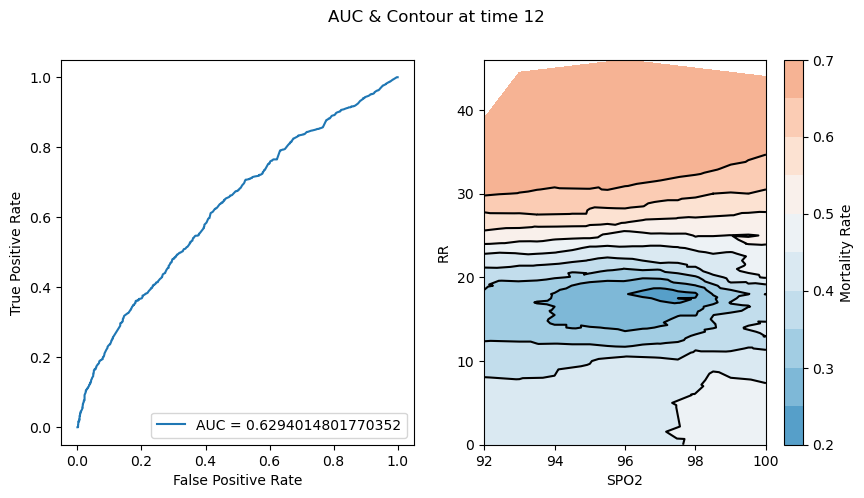

In [ ]:
os.makedirs("results/SPO2_RR/", exist_ok=True)
timepoints, AUCs = cal_mortality(
    spo2_events_with_admissions, rr_events_with_admissions, dst_dir="results/SPO2_RR/",
    time=1, time_window_width=6, max_time=12, time_step=1, M1_name="SPO2", M2_name="RR")

Text(0.5, 1.0, 'AUC for SpO2 and Respiratory Rate at given time points')

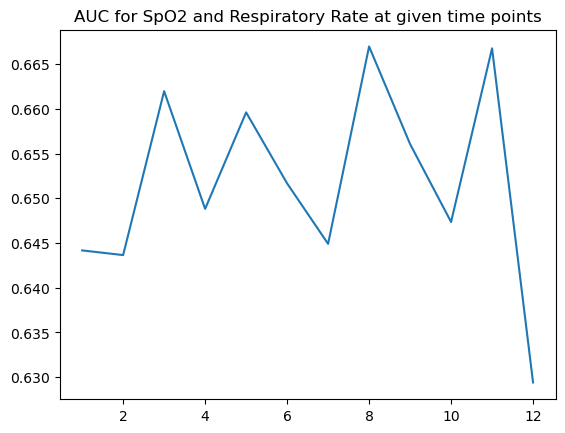

In [ ]:
fig, ax = plt.subplots()
ax.plot(timepoints, AUCs)
plt.title("AUC for SpO2 and Respiratory Rate at given time points")

### Temperature & RR

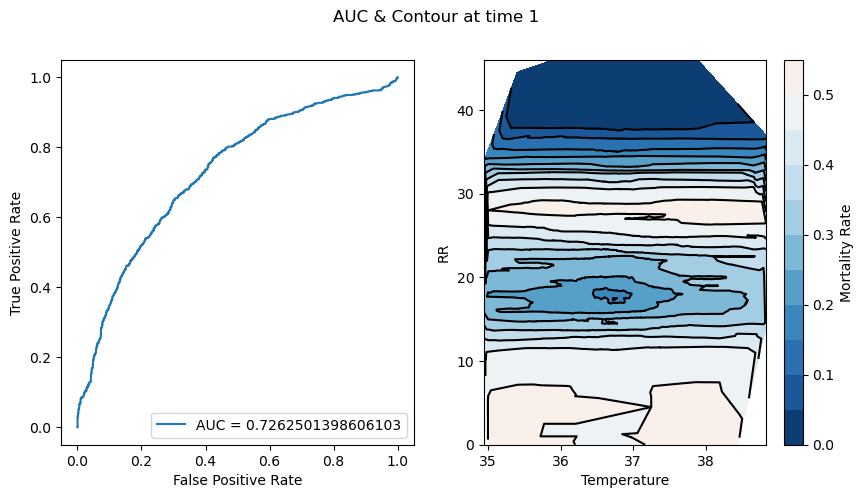

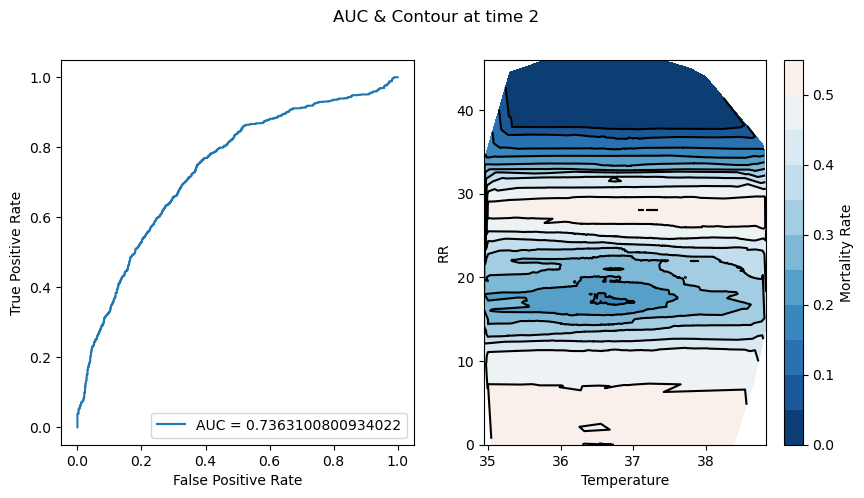

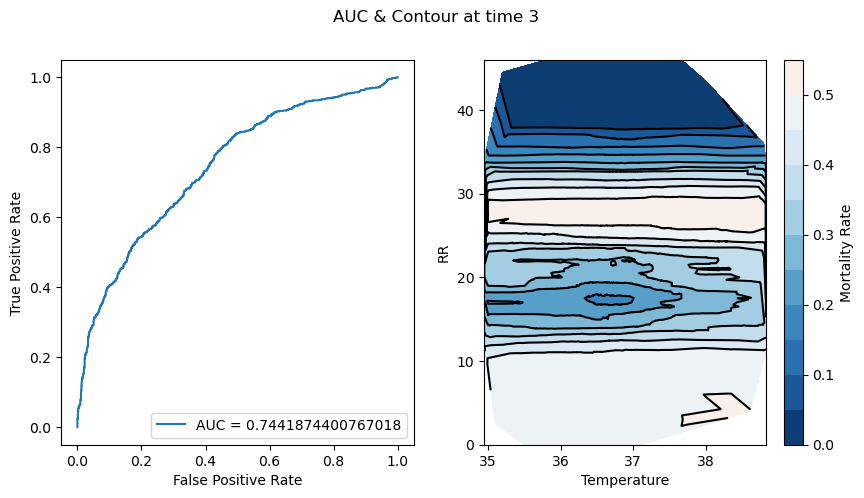

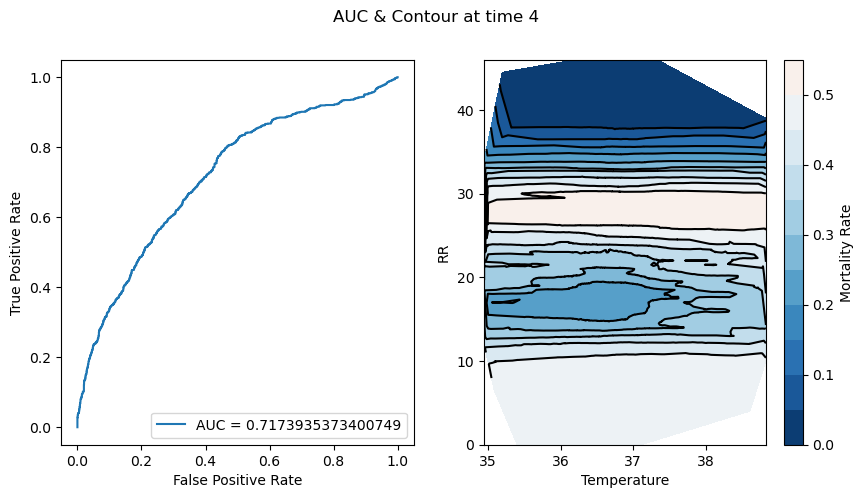

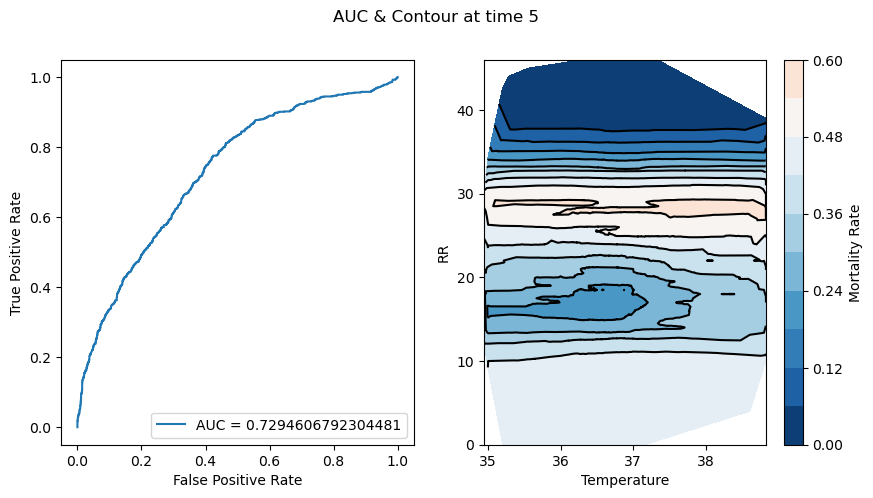

...

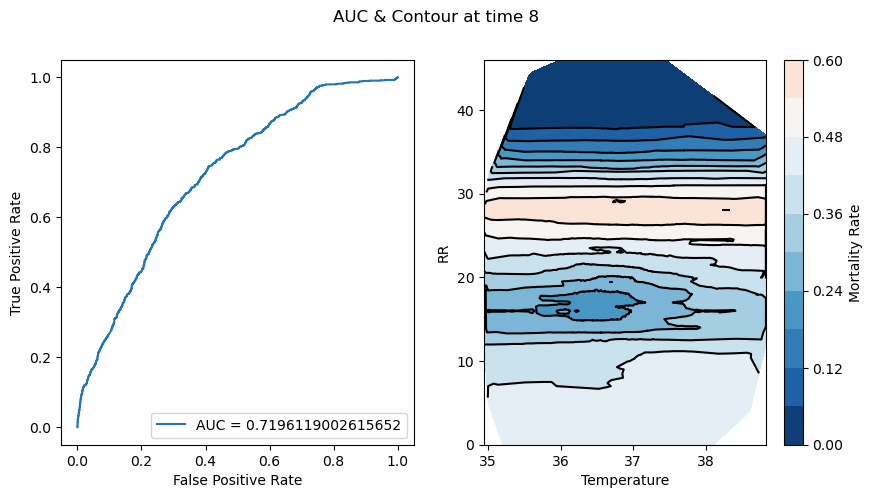

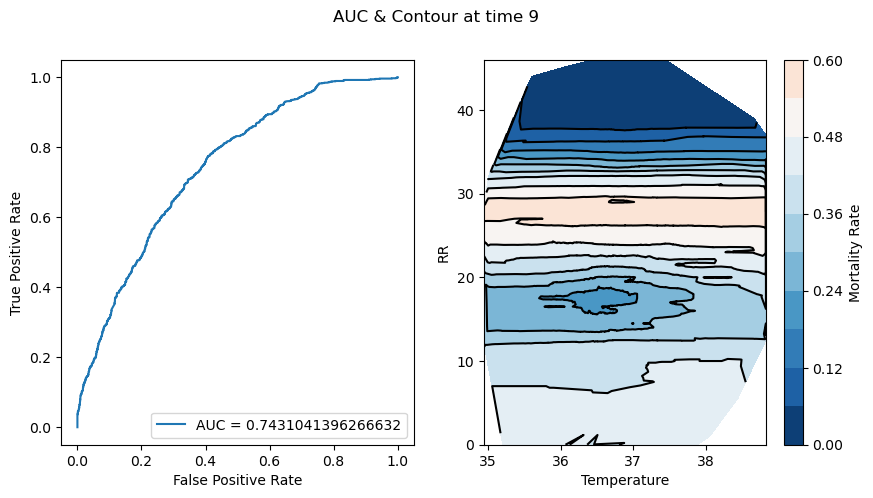

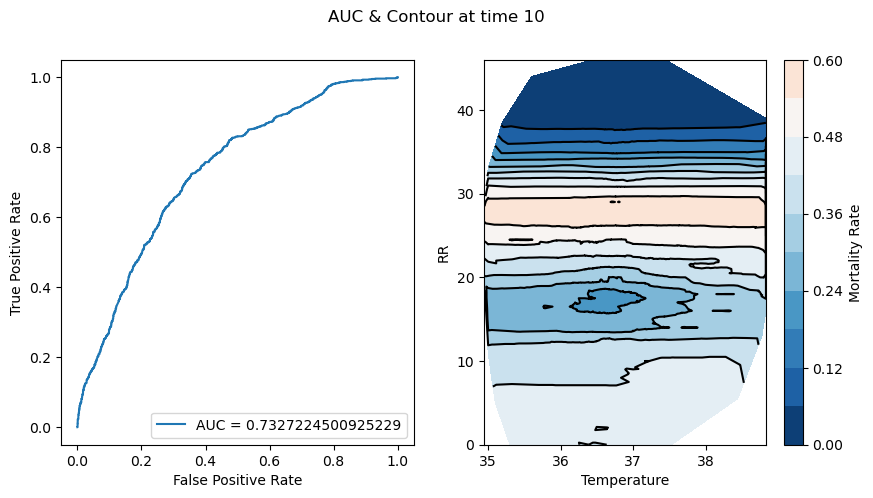

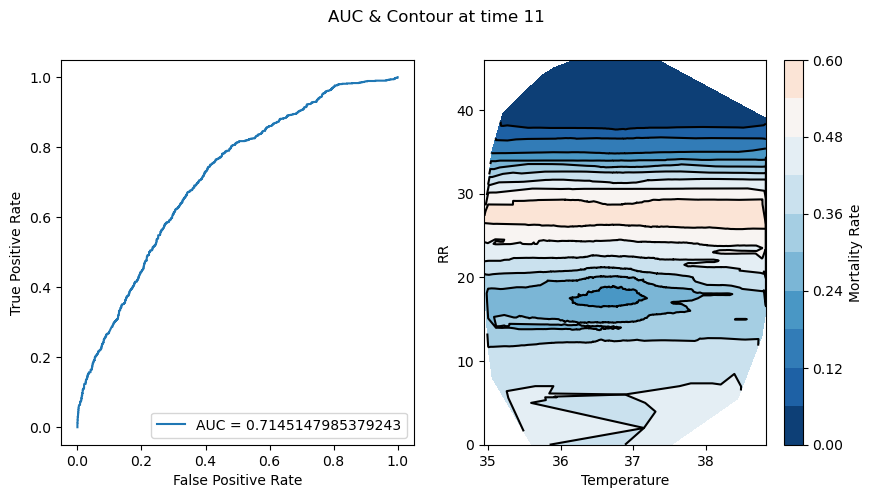

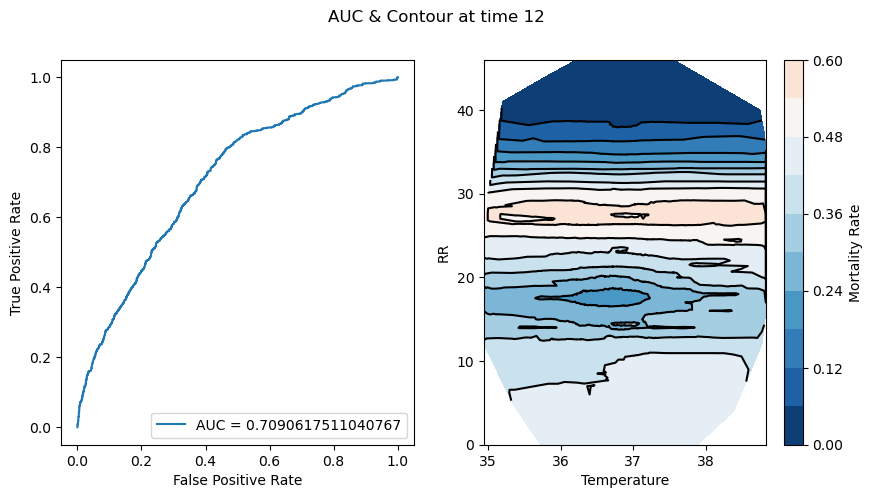

In [ ]:
os.makedirs("results/TEMP_RR/", exist_ok=True)
timepoints, AUCs = cal_mortality(
    temperature_events_with_admissions, rr_events_with_admissions, dst_dir="results/TEMP_RR/",
    time=1, time_window_width=6, max_time=12, time_step=1, M1_name="Temperature", M2_name="RR")

Text(0.5, 1.0, 'AUC for temperature and Respiratory Rate at given time points')

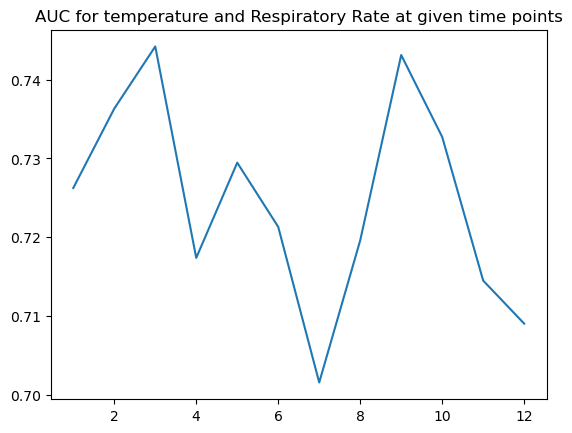

In [ ]:
fig, ax = plt.subplots()
ax.plot(timepoints, AUCs)
plt.title("AUC for temperature and Respiratory Rate at given time points")